# Предсказание есть ли у клиента реальный счет

### Получение данных с источников

In [27]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [28]:
pd.set_option('display.max_columns', 44)
pd.set_option('display.max_rows', 3000)
pd.set_option('display.max_colwidth', 200) 

In [29]:
ds_positions_df = pd.read_csv(r".\ds_userdata\ds_userdata\ds_positions.csv", sep='\t', engine='python')
ds_positions_df.head(5)

,id,user_id,user_balance_id,instrument_type,instrument_underlying,instrument_active_id,instrument_expiration,instrument_strike,instrument_dir,position_type,count,leverage,buy_amount,buy_amount_enrolled,sell_amount,sell_amount_enrolled,pnl_realized,pnl_realized_enrolled,commission,commission_enrolled,close_effect_amount,close_reason,create_at,close_at,pnl_total,pnl_total_enrolled,close_underlying_price,swap,swap_enrolled,user_balance_type,client_platform_id,open_underlying_price,take_profit_at,stop_lose_at,take_profit_date,stop_lose_date,spread_total_enrolled,margin_call,margin_call_enrolled,charge,charge_enrolled,volatility,custodial,custodial_enrolled
0,741538469,124963444,196865570,crypto,ETHUSD-L,831,2019-09-01 00:00:00+03,NaN,NaN,short,0.000000,50,1001943,1001943,999879,999879,-103155,-103155,0,0,0,expired,2019-08-31 11:06:40.056+03,2019-09-01 00:00:00+03,-103155,-103155,167549000,0,0,4,8,167204000,NaN,NaN,NaN,NaN,NaN,0,0,0,0,NaN,0,0
1,10388555637,105433234,90262176,digital-option,NZDUSD-OTC,80,2019-09-01 01:48:00+03,0.627786,call,long,0.009202,1,2000000,481090,0,0,0,0,0,0,0,expired,2019-09-01 01:46:35.067+03,2019-09-01 01:48:02.647+03,-1999883,-481062,627774,0,0,1,8,627786,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0.000011,0,0
2,10388781174,143260369,228153647,digital-option,USDJPY-OTC,85,2019-09-01 03:49:00+03,105.723900,call,long,0.038257,1,2000000,2000000,0,0,0,0,0,0,0,expired,2019-09-01 03:47:42.044+03,2019-09-01 03:49:02.518+03,-1999991,-1999991,105720700,0,0,1,2,105723900,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0.000012,0,0
3,10388805684,143260369,228153647,digital-option,AUDCAD-OTC,86,2019-09-01 04:02:00+03,0.889982,put,long,0.019127,1,1000000,1000000,0,0,0,0,0,0,0,expired,2019-09-01 04:01:03.146+03,2019-09-01 04:02:02.401+03,-999984,-999984,889996,0,0,1,2,889982,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0.000008,0,0
4,10388812382,143260369,228153647,digital-option,AUDCAD-OTC,86,2019-09-01 04:05:00+03,0.890097,put,long,0.000000,1,1000000,1000000,1493057,1493057,493079,493079,0,0,0,default,2019-09-01 04:04:29.148+03,2019-09-01 04:04:58.112+03,493079,493079,890084,0,0,1,2,890097,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0.000008,0,0


In [30]:
ds_appsflyer_df = pd.read_csv(r".\ds_userdata\ds_userdata\ds_appsflyer.csv", sep='\t', engine='python')
ds_appsflyer_df.head(5)

,user_id,id,click_time,install_time,client_platform_id,country_id,device,os_version,apps_flyer_device_id,aff_id,media_source,created_at
0,155968324,110099894,2019-10-17 09:58:28,2019-10-17 09:58:28,12,-1.0,"iPhone12,1",13.1.2,1571302786477-972824,165,Organic,2019-10-17 09:58:59
1,142098889,110098860,2019-10-17 09:44:20,2019-10-17 09:44:20,3,78.0,"iPad11,1",13.1.2,1571312618916-139305,160,Organic,2019-10-17 09:44:51
2,156038389,110097901,2019-10-17 09:30:08,2019-10-17 09:30:41,2,175.0,HUAWEI-LYA-L29,9,1571304639158-3775642868910920374,161,None,2019-10-17 09:31:11
3,157069588,110097636,2019-10-17 09:23:24,2019-10-17 09:26:52,2,180.0,samsung-SM-A260F,8.1.0,1571304405712-6154973233583185520,38737,SOCIARO,2019-10-17 09:27:23
4,157069537,110097589,2019-10-17 09:20:16,2019-10-17 09:26:12,2,200.0,HUAWEI-SNE-LX1,9,1571304369154-2060259551930846922,53883,liftoff_int,2019-10-17 09:26:43


In [31]:
ds_deposits_df = pd.read_csv(r".\ds_userdata\ds_userdata\ds_deposits.csv", sep='\t', engine='python')
ds_deposits_df.head(5)

,op_id,user_id,amount,currency,enrolled_amount,enrolled_currency,payment_method_id,type,created,updated,user_balance_id,client_platform_id
0,18137772533,108248584,63270000,USD,63270000,USD,7,deposit,2019-09-03 10:52:39.000000,2019-09-03 10:52:39.000000,95014947,17
1,18141899562,82650757,20000000,USD,20000000,USD,9,deposit,2019-09-03 13:45:30.000000,2019-09-03 13:45:30.000000,50189171,15
2,18195563304,142368925,15000000,USD,15000000,USD,392,deposit,2019-09-05 07:27:34.000000,2019-09-05 07:27:34.000000,226624664,15
3,18198759863,108248584,64300000,USD,64300000,USD,7,deposit,2019-09-05 10:27:12.000000,2019-09-05 10:27:12.000000,95014947,17
4,18215409102,87392956,15000000,USD,15000000,USD,55,deposit,2019-09-05 20:06:25.000000,2019-09-05 20:06:25.000000,58109972,2


In [32]:
ds_events_df = pd.read_csv(r".\ds_userdata\ds_userdata\ds_events.csv", sep='\t', engine='python')
ds_events_df.head(5)

,name,parameters,platform_id,user_id,device_id,duration,category,time
0,get-first-candles,"{""active-id"":""8""}",9,154623745,36c924daddc4757984d9ea3597e3e6a6,742.0,system,2019-09-03 06:10:17
1,get-first-candles,"{""active-id"":""101""}",9,154623745,36c924daddc4757984d9ea3597e3e6a6,317.0,system,2019-10-04 15:12:41
2,traderoom_deal-put,"{""asset_id"":""101"",""balance_type"":""4"",""expiration_time"":""1569981960"",""instrument_type"":""turbo"",""leverage_value"":""1"",""order_type"":""market""}",8,152286034,0000000003069119-0000000000000008,NaN,button_pressed,2019-09-11 02:21:12
3,get-underlying-list,"{""instrument-type"":""digital-option"",""status"":""2000""}",9,154623745,36c924daddc4757984d9ea3597e3e6a6,415.0,system,2019-10-03 03:38:44
4,binary-options_open-time,"{""country_id"":194,""id"":5702514011}",8,152286034,0000000003069119-0000000000000008,330.0,system,2019-09-04 06:58:52


### Препроцессинг данных

#### Функции и методы для процессинга данных и статистического анализа

In [33]:
def remove_null_columns_from_dataset(df):
    non_null_columns = [col for col in df.columns if df.loc[:, col].notna().any()]
    return df[non_null_columns]

In [34]:
def remove_constant_features_from_dataset(df):

    constant_features = [
        feat for feat in df.columns if df[feat].nunique(dropna=True) == 1
    ]

    df.drop(labels=constant_features, axis=1, inplace=True)
    print("Constant features removed: " + str(constant_features))
          
    return df

In [35]:
def remove_quasi_constant_features_from_dataset(df,rate):
    # create an empty list
    quasi_constant_feat = []

    # iterate over every feature
    for feature in df.columns:

        # find the predominant value, that is the value that is shared
        # by most observations
        predominant = (df[feature].value_counts() / np.float(
            len(df))).sort_values(ascending=False).values[0]

        #print(feature + " " + str(round(predominant,2)))

        # evaluate the predominant feature: do more than 99% of the observations
        # show 1 value?
        if predominant > rate:
            # if yes, add the variable to the list
            quasi_constant_feat.append(feature)
            
    print("Quasi Constant features removed: " + str(quasi_constant_feat))
        
    df.drop(labels=quasi_constant_feat, axis=1, inplace=True)
        
    return df

In [36]:
def visualize_correlation_heatmap(df):
    import seaborn as sns
    
    corrmat = df.corr(method='pearson')
    # some more parameters for the figure
    fig, ax = plt.subplots()
    fig.set_size_inches(11,11)

    # and now plot the correlation matrix
    sns.heatmap(corrmat)
    
    return corrmat 

In [37]:
# with the following function we can select highly correlated features
# it will remove the first feature that is correlated with anything else
# without any further insight.

def correlation(dataset, threshold):
    
    # create a set where I will store the names of correlated columns
    col_corr = set()
    
    # create the correlation matrix
    corr_matrix = dataset.corr()
    
    # for each feature in the dataset (columns of the correlation matrix)
    for i in range(len(corr_matrix.columns)):
        
        # check with other features
        for j in range(i):
            
            # if the correlation is higher than a certain threshold
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                
                # print correlation, and variables examined
                # keep in mind that the columns and rows of the dataframe are identical
                # so we can identify the features being examned by looking for i,j
                # in the column names
                print(abs(corr_matrix.iloc[i, j]), corr_matrix.columns[i], corr_matrix.columns[j])
                
                # get the name of the correlated feature
                colname = corr_matrix.columns[j]
                
                # and add it to our correlated set
                col_corr.add(colname)
                
    return col_corr

In [38]:
def find_correlated_groups(df,corrmat):

    # find groups of correlated features

    grouped_feature_ls = []
    correlated_groups = []

    for feature in corrmat.feature1.unique():

        if feature not in grouped_feature_ls:

            # find all features correlated to a single feature
            correlated_block = corrmat[corrmat.feature1 == feature]
            grouped_feature_ls = grouped_feature_ls + list(
                correlated_block.feature2.unique()) + [feature]

            # append the block of features to the list
            correlated_groups.append(correlated_block)

    print('found {} correlated groups'.format(len(correlated_groups)))
    print('out of {} total features'.format(df.shape[1]))
    return correlated_groups

In [39]:
def choose_the_best_feature_from_correlated_group(X_train, y_train,group, group_feature):

    from sklearn.ensemble import RandomForestClassifier
    
    # add all features of the group to a list
    features = list(group['feature2'].unique())+[group_feature]

    # train a random forest 
    rf = RandomForestClassifier(n_estimators=200, random_state=39, max_depth=4)
    rf.fit(X_train[features].fillna(0), y_train)
    
    
    # get the feature importance attributed by the 
    # random forest model (more on this in coming lectures)

    importance = pd.concat(
        [pd.Series(features),
         pd.Series(rf.feature_importances_)], axis=1)

    importance.columns = ['feature', 'importance']

    # sort features by importance, most important first
    importance.sort_values(by='importance', ascending=False)
    
    return importance

In [40]:
def get_best_correlated_features_from_groups(df,correlated_groups):
    X_train = df
    y_train = df[1]#df['user_balance_type'].apply(lambda x: 1 if x == 1 else 0)
    X_train = df.drop([1], axis='columns', inplace=False)

    importance_features_list =[]
    for group in correlated_groups:
        #print(group)
        feature1 = np.array(group['feature1'])[0]
        print("Choosing the best feature from group: " + str(feature1))
        importance = choose_the_best_feature_from_correlated_group(X_train, y_train,group, feature1)
        #importance = pd.DataFrame(importance)
        importance_features_list.append(importance)

        print()
        
    return importance_features_list


In [41]:
def remove_duplicate_features(df):
    # check for duplicated features in the training set
    duplicated_feat = []
    for i in range(0, len(df.columns)):
        if i % 10 == 0:  # this helps me understand how the loop is going
            print(i)

        col_1 = df.columns[i]

        for col_2 in df.columns[i + 1:]:
            if df[col_1].equals(df[col_2]):
                duplicated_feat.append(col_2)

    print("Duplicated features removed: {0}. \n Features: {1}".format(len(duplicated_feat),str(duplicated_feat)))
    return df

### Разработка фич

In [46]:
#Get Users-Account Types
def get_users_account_types(positions_df):
    
    users_balance_types = positions_df.drop_duplicates(['user_id','user_balance_type'])[['user_id','user_balance_type']].reset_index()
    users_real_balance = users_balance_types[users_balance_types.user_balance_type==1]['user_id'].tolist()
    users_demo_balance = users_balance_types[users_balance_types.user_balance_type==4]['user_id'].tolist()

    all_users= positions_df.user_id.unique()
    df_all_users = pd.DataFrame(all_users, columns=['users'])
    df_all_users['real_account'] =df_all_users['users'].apply(lambda x: 1 if ((x in users_real_balance )) else 0)
    
    return df_all_users

Составляем датасет - связка между пользователями и признаком, имеется ли у них реальный счет (1) или только демо счет (0)

In [47]:
df = ds_positions_df
positions_feature_set = get_users_account_types(ds_positions_df)
positions_feature_set

,users,real_account
0,124963444,0
1,105433234,1
2,143260369,1
3,150012217,1
4,150130063,1
5,108248584,1
6,59910499,1
7,150485509,1
8,82280143,1
9,106145803,1


### Выделение фич из датасетов

### ds_positions_df

In [48]:
def get_deal_duration_feature(df):

    import time
    import datetime

    df['create_at'] = pd.to_datetime(df['create_at'])
    df['close_at'] = pd.to_datetime(df['close_at'])

    df['deal_duration']  =(df['close_at']-df['create_at']).astype('timedelta64[s]')

    return df

In [49]:
def get_deal_price_open_close_diff(df):
    
    df['deal_price_open_close_diff'] = df['close_underlying_price']  - df['open_underlying_price']
    
    return df

In [50]:
df['volatility'] = df['volatility'].fillna(0)

In [51]:
df = ds_positions_df

#Adding columns features to positions dataset
df = get_deal_duration_feature(df)
df = get_deal_price_open_close_diff(df)

In [52]:
def get_positions_stats_per_user(df_positions, _user_id):
    
    df_positions_user = df_positions[df_positions.user_id ==_user_id]
    user_positions_stats = {}
    #Сколько позиций было открыто пользователем
    positions_cnt = df_positions_user.shape[0]
    
    #Сколько различных инструментов торговал пользователь
    instrument_underlying_cnt = df_positions_user.instrument_underlying.unique().shape[0]
    
    #Средняя продолжительность сделки сек
    avg_deal_duration  = round(df_positions_user['deal_duration'].mean(),2)
    
    #Суммарный доход трейдера за период
    pnl_sum = round(df_positions_user['pnl_total'].sum(),2)
    
    #Средний доход трейдера за сделку
    avg_pnl_deal = round(pnl_sum / positions_cnt,2)
    
    #Средняя волатильность за сделку
    avg_deal_volatility = round(df_positions_user['deal_duration'].mean(),2)
    
    #Среднее движение цены за сделку
    avg_price_moving_per_deal = round(df_positions_user['deal_price_open_close_diff'].mean(),2)
    


    user_positions_stats = {"positions_cnt": positions_cnt
                            , "instrument_underlying_cnt": instrument_underlying_cnt
                            , "avg_deal_duration": avg_deal_duration
                            , "pnl_sum":pnl_sum
                            , "avg_pnl_deal":avg_pnl_deal
                            , "avg_deal_volatility":avg_deal_volatility
                            , "avg_price_moving_per_deal": avg_price_moving_per_deal
                           }
    
    
    return user_positions_stats

In [53]:
positions_feature_set['user_positions_stats'] = positions_feature_set['users'].apply(lambda x: get_positions_stats_per_user(df, x))

In [54]:
positions_feature_set

,users,real_account,user_positions_stats
0,124963444,0,"{'positions_cnt': 9, 'instrument_underlying_cnt': 6, 'avg_deal_duration': 147022.0, 'pnl_sum': -151540095, 'avg_pnl_deal': -16837788.33, 'avg_deal_volatility': 147022.0, 'avg_price_moving_per_deal..."
1,105433234,1,"{'positions_cnt': 307, 'instrument_underlying_cnt': 25, 'avg_deal_duration': 4776.77, 'pnl_sum': 10328713902, 'avg_pnl_deal': 33644019.22, 'avg_deal_volatility': 4776.77, 'avg_price_moving_per_dea..."
2,143260369,1,"{'positions_cnt': 791, 'instrument_underlying_cnt': 30, 'avg_deal_duration': 1939.16, 'pnl_sum': -32173676026, 'avg_pnl_deal': -40674685.24, 'avg_deal_volatility': 1939.16, 'avg_price_moving_per_d..."
3,150012217,1,"{'positions_cnt': 559, 'instrument_underlying_cnt': 26, 'avg_deal_duration': 500.09, 'pnl_sum': -189944053, 'avg_pnl_deal': -339792.58, 'avg_deal_volatility': 500.09, 'avg_price_moving_per_deal': ..."
4,150130063,1,"{'positions_cnt': 370, 'instrument_underlying_cnt': 25, 'avg_deal_duration': 1292.32, 'pnl_sum': -1886163315, 'avg_pnl_deal': -5097738.69, 'avg_deal_volatility': 1292.32, 'avg_price_moving_per_dea..."
5,108248584,1,"{'positions_cnt': 5783, 'instrument_underlying_cnt': 21, 'avg_deal_duration': 42.27, 'pnl_sum': -2842944365910, 'avg_pnl_deal': -491603729.19, 'avg_deal_volatility': 42.27, 'avg_price_moving_per_d..."
6,59910499,1,"{'positions_cnt': 185, 'instrument_underlying_cnt': 17, 'avg_deal_duration': 57.66, 'pnl_sum': -50018722, 'avg_pnl_deal': -270371.47, 'avg_deal_volatility': 57.66, 'avg_price_moving_per_deal': 533..."
7,150485509,1,"{'positions_cnt': 876, 'instrument_underlying_cnt': 26, 'avg_deal_duration': 96.03, 'pnl_sum': -75189215983, 'avg_pnl_deal': -85832438.34, 'avg_deal_volatility': 96.03, 'avg_price_moving_per_deal'..."
8,82280143,1,"{'positions_cnt': 1272, 'instrument_underlying_cnt': 94, 'avg_deal_duration': 597361.17, 'pnl_sum': -5758768179719, 'avg_pnl_deal': -4527333474.62, 'avg_deal_volatility': 597361.17, 'avg_price_mov..."
9,106145803,1,"{'positions_cnt': 422, 'instrument_underlying_cnt': 27, 'avg_deal_duration': 338.14, 'pnl_sum': 20826887640, 'avg_pnl_deal': 49352814.31, 'avg_deal_volatility': 338.14, 'avg_price_moving_per_deal'..."


### ds_appsflyer_df

In [55]:
appsflyer_feature_set = get_users_account_types(ds_positions_df)

#Full dataset
df = ds_appsflyer_df
#Remove empty columns from dataset
df = remove_null_columns_from_dataset(df)
#Removing columns with constant features
df = remove_constant_features_from_dataset(df)
#Removing columns with constant features
rate = 0.95
df = remove_quasi_constant_features_from_dataset(df,rate)

Constant features removed: []
Quasi Constant features removed: []


In [56]:
df.columns

Index(['user_id', 'id', 'click_time', 'install_time', 'client_platform_id',
       'country_id', 'device', 'os_version', 'apps_flyer_device_id', 'aff_id',
       'media_source', 'created_at'],
      dtype='object')

In [57]:
def prepare_columns_appsflyer(df):

    import time
    import datetime

    df['click_time'] = pd.to_datetime(df['click_time'])
    df['install_time'] = pd.to_datetime(df['install_time'])
    df['created_at'] = pd.to_datetime(df['created_at'])
    
    df['click_to_install_app_seconds'] = (df['install_time']-df['click_time']).astype('timedelta64[s]')
    df['created_to_install_app_seconds'] = (df['created_at']-df['install_time']).astype('timedelta64[s]')


    return df

In [58]:
df =  prepare_columns_appsflyer(df)

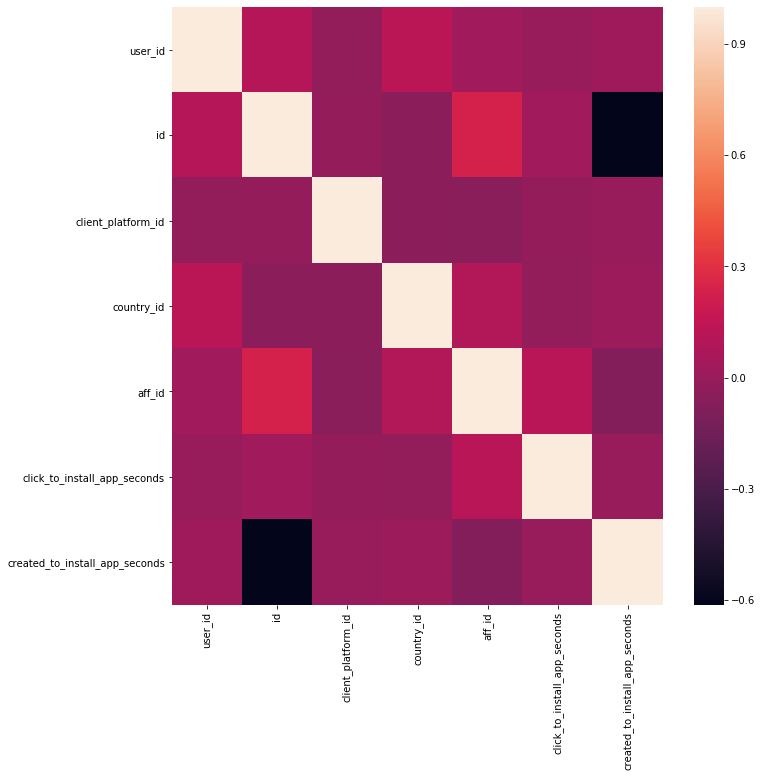

In [59]:
corrmat = visualize_correlation_heatmap(df)

In [60]:
corr_features = correlation(df, 0.8)
len(set(corr_features))

0

In [61]:
def get_appsflyer_stats_per_user(ds_appsflyer_df, _user_id):
    
    ds_appsflyer_df = ds_appsflyer_df[ds_appsflyer_df.user_id ==_user_id]
    
    user_appsflyer_stats = {}
    
    #Сколько раз пользователь устанавливал приложение
    app_installation_cnt = ds_appsflyer_df.shape[0]
    
    #Время отклика по установке приложения в секундах
    avg_click_to_install_app_seconds = round(ds_appsflyer_df['click_to_install_app_seconds'].mean(),2)
    avg_created_to_install_app_seconds= round(ds_appsflyer_df['created_to_install_app_seconds'].mean(),2)
    
    #Количество разных ресурсов, через которые клиент узнал о программе и установил ее
    media_resorces_cnt = ds_appsflyer_df['media_source'].unique().shape[0]
    
    #Количество платформ, которые имеются у клиента
    client_platform_cnt = ds_appsflyer_df['client_platform_id'].unique().shape[0]


    user_app_stats = {"app_installation_cnt": app_installation_cnt
                      , "avg_click_to_install_app_seconds":avg_click_to_install_app_seconds
                      , "avg_created_to_install_app_seconds":avg_created_to_install_app_seconds
                      , "media_resorces_cnt":media_resorces_cnt
                      , "client_platform_cnt": client_platform_cnt
                     }
    
    return user_app_stats

In [62]:
appsflyer_feature_set['user_app_stats'] = appsflyer_feature_set['users'].apply(lambda x: get_appsflyer_stats_per_user(df, x))

In [63]:
appsflyer_feature_set

,users,real_account,user_app_stats
0,124963444,0,"{'app_installation_cnt': 7, 'avg_click_to_install_app_seconds': 0.0, 'avg_created_to_install_app_seconds': 31.57, 'media_resorces_cnt': 1, 'client_platform_cnt': 2}"
1,105433234,1,"{'app_installation_cnt': 5, 'avg_click_to_install_app_seconds': 3503.4, 'avg_created_to_install_app_seconds': 25.8, 'media_resorces_cnt': 4, 'client_platform_cnt': 2}"
2,143260369,1,"{'app_installation_cnt': 2, 'avg_click_to_install_app_seconds': 45.0, 'avg_created_to_install_app_seconds': 31.5, 'media_resorces_cnt': 2, 'client_platform_cnt': 1}"
3,150012217,1,"{'app_installation_cnt': 3, 'avg_click_to_install_app_seconds': 100042.33, 'avg_created_to_install_app_seconds': 32.0, 'media_resorces_cnt': 2, 'client_platform_cnt': 2}"
4,150130063,1,"{'app_installation_cnt': 2, 'avg_click_to_install_app_seconds': 42.0, 'avg_created_to_install_app_seconds': 31.0, 'media_resorces_cnt': 2, 'client_platform_cnt': 1}"
5,108248584,1,"{'app_installation_cnt': 7, 'avg_click_to_install_app_seconds': 3821.86, 'avg_created_to_install_app_seconds': 31.57, 'media_resorces_cnt': 4, 'client_platform_cnt': 1}"
6,59910499,1,"{'app_installation_cnt': 3, 'avg_click_to_install_app_seconds': 29629.67, 'avg_created_to_install_app_seconds': 32.33, 'media_resorces_cnt': 2, 'client_platform_cnt': 1}"
7,150485509,1,"{'app_installation_cnt': 2, 'avg_click_to_install_app_seconds': 0.0, 'avg_created_to_install_app_seconds': 32.0, 'media_resorces_cnt': 1, 'client_platform_cnt': 1}"
8,82280143,1,"{'app_installation_cnt': 19, 'avg_click_to_install_app_seconds': 85704.05, 'avg_created_to_install_app_seconds': 37.05, 'media_resorces_cnt': 4, 'client_platform_cnt': 1}"
9,106145803,1,"{'app_installation_cnt': 5, 'avg_click_to_install_app_seconds': 450609.8, 'avg_created_to_install_app_seconds': 25.2, 'media_resorces_cnt': 4, 'client_platform_cnt': 1}"


### ds_events

In [64]:
events_feature_set = get_users_account_types(ds_positions_df)

#Full dataset
df = ds_events_df
#Remove empty columns from dataset
df = remove_null_columns_from_dataset(df)
#Removing columns with constant features
df = remove_constant_features_from_dataset(df)
#Removing columns with constant features
rate = 0.95
df = remove_quasi_constant_features_from_dataset(df,rate)

Constant features removed: []
Quasi Constant features removed: []


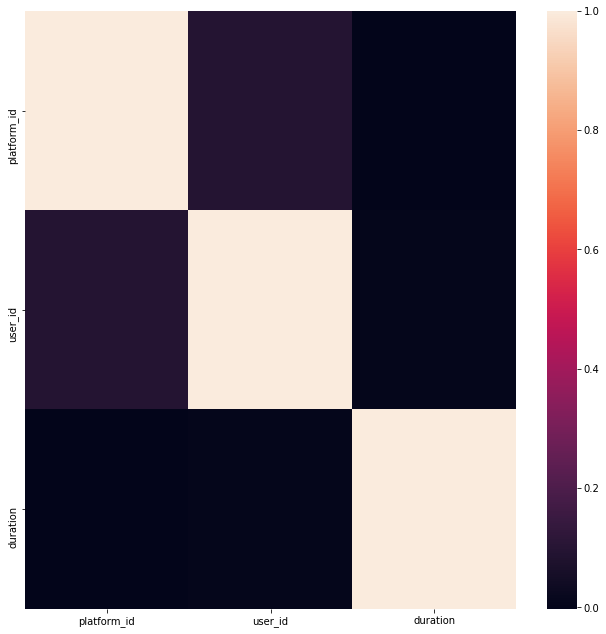

In [65]:
corrmat = visualize_correlation_heatmap(df)

In [66]:
corr_features = correlation(df, 0.8)
len(set(corr_features))

0

In [67]:
def get_events_stats_per_user(ds_events_df, _user_id):
    
    ds_events_df = ds_events_df[ds_events_df.user_id ==_user_id]
    
    user_events_stats = {}
    
    operations_per_user_cnt =  ds_events_df.shape[0]
    
    df_position_created_evt = ds_events_df[ds_events_df.name =='position-created'].shape[0]
    
    df_open_position_evt = ds_events_df[ds_events_df.name =='open-position'].shape[0]
    
    df_get_first_candles_evt = ds_events_df[ds_events_df.name =='get-first-candles'].shape[0]
    
    df_traderoom_deal_put_evt = ds_events_df[ds_events_df.name =='traderoom_deal-put'].shape[0]
    
    df_get_underlying_list = ds_events_df[ds_events_df.name =='get-underlying-list'].shape[0]
    
    binary_options_open_time_evt = ds_events_df[ds_events_df.name =='binary-options_open-time'].shape[0]
    
    get_strike_list_evt = ds_events_df[ds_events_df.name =='get-strike-list'].shape[0]
    
    traderoom_deal_call_evt = ds_events_df[ds_events_df.name =='traderoom_deal-call'].shape[0]
    
    app_launch_evt = ds_events_df[ds_events_df.name =='app_launch'].shape[0]
    
    order_created_evt = ds_events_df[ds_events_df.name =='order_created'].shape[0]
    
    place_order_temp_response_evt = ds_events_df[ds_events_df.name =='place-order-temp-response'].shape[0]
    
    get_instruments_evt = ds_events_df[ds_events_df.name =='get-instruments'].shape[0]


    
    user_events_stats = {"operations_per_user_cnt": operations_per_user_cnt
                         , "df_position_created_evt" : df_position_created_evt
                         , "df_open_position_evt" : df_open_position_evt
                         , "df_get_first_candles_evt":df_get_first_candles_evt
                         , "df_traderoom_deal_put_evt":df_traderoom_deal_put_evt
                         , "df_get_underlying_list": df_get_underlying_list
                         , "binary_options_open_time_evt":binary_options_open_time_evt
                         , "get_strike_list_evt": get_strike_list_evt
                         , "traderoom_deal_call_evt":traderoom_deal_call_evt
                         , "app_launch_evt": app_launch_evt
                         , "order_created_evt":order_created_evt
                         , "place_order_temp_response_evt":place_order_temp_response_evt
                         , "get_instruments_evt" : get_instruments_evt
                        }
    
    
    
    return user_events_stats

In [68]:
events_feature_set['user_app_stats'] = events_feature_set['users'].apply(lambda x: get_events_stats_per_user(df, x))

In [69]:
events_feature_set

,users,real_account,user_app_stats
0,124963444,0,"{'operations_per_user_cnt': 89, 'df_position_created_evt': 1, 'df_open_position_evt': 3, 'df_get_first_candles_evt': 13, 'df_traderoom_deal_put_evt': 6, 'df_get_underlying_list': 7, 'binary_option..."
1,105433234,1,"{'operations_per_user_cnt': 4308, 'df_position_created_evt': 67, 'df_open_position_evt': 65, 'df_get_first_candles_evt': 1105, 'df_traderoom_deal_put_evt': 136, 'df_get_underlying_list': 136, 'bin..."
2,143260369,1,"{'operations_per_user_cnt': 1229, 'df_position_created_evt': 118, 'df_open_position_evt': 127, 'df_get_first_candles_evt': 72, 'df_traderoom_deal_put_evt': 77, 'df_get_underlying_list': 40, 'binar..."
3,150012217,1,"{'operations_per_user_cnt': 882, 'df_position_created_evt': 45, 'df_open_position_evt': 42, 'df_get_first_candles_evt': 200, 'df_traderoom_deal_put_evt': 42, 'df_get_underlying_list': 43, 'binary_..."
4,150130063,1,"{'operations_per_user_cnt': 1318, 'df_position_created_evt': 49, 'df_open_position_evt': 54, 'df_get_first_candles_evt': 79, 'df_traderoom_deal_put_evt': 24, 'df_get_underlying_list': 105, 'binary..."
5,108248584,1,"{'operations_per_user_cnt': 3277, 'df_position_created_evt': 0, 'df_open_position_evt': 382, 'df_get_first_candles_evt': 143, 'df_traderoom_deal_put_evt': 254, 'df_get_underlying_list': 144, 'bina..."
6,59910499,1,"{'operations_per_user_cnt': 299, 'df_position_created_evt': 0, 'df_open_position_evt': 34, 'df_get_first_candles_evt': 22, 'df_traderoom_deal_put_evt': 17, 'df_get_underlying_list': 10, 'binary_op..."
7,150485509,1,"{'operations_per_user_cnt': 2174, 'df_position_created_evt': 52, 'df_open_position_evt': 64, 'df_get_first_candles_evt': 178, 'df_traderoom_deal_put_evt': 81, 'df_get_underlying_list': 67, 'binary..."
8,82280143,1,"{'operations_per_user_cnt': 7136, 'df_position_created_evt': 1834, 'df_open_position_evt': 479, 'df_get_first_candles_evt': 1711, 'df_traderoom_deal_put_evt': 332, 'df_get_underlying_list': 326, '..."
9,106145803,1,"{'operations_per_user_cnt': 0, 'df_position_created_evt': 0, 'df_open_position_evt': 0, 'df_get_first_candles_evt': 0, 'df_traderoom_deal_put_evt': 0, 'df_get_underlying_list': 0, 'binary_options_..."


### ds_deposits

In [70]:
from numpy import *
deposits_feature_set = get_users_account_types(ds_positions_df)

#Full dataset
df = ds_deposits_df
#Remove empty columns from dataset
df = remove_null_columns_from_dataset(df)
#Removing columns with constant features
df = remove_constant_features_from_dataset(df)
#Removing columns with constant features
rate = 0.95
df = remove_quasi_constant_features_from_dataset(df,rate)
df= remove_duplicate_features(df)

Constant features removed: ['enrolled_currency', 'type']
Quasi Constant features removed: []
0
Duplicated features removed: 1. 
 Features: ['updated']


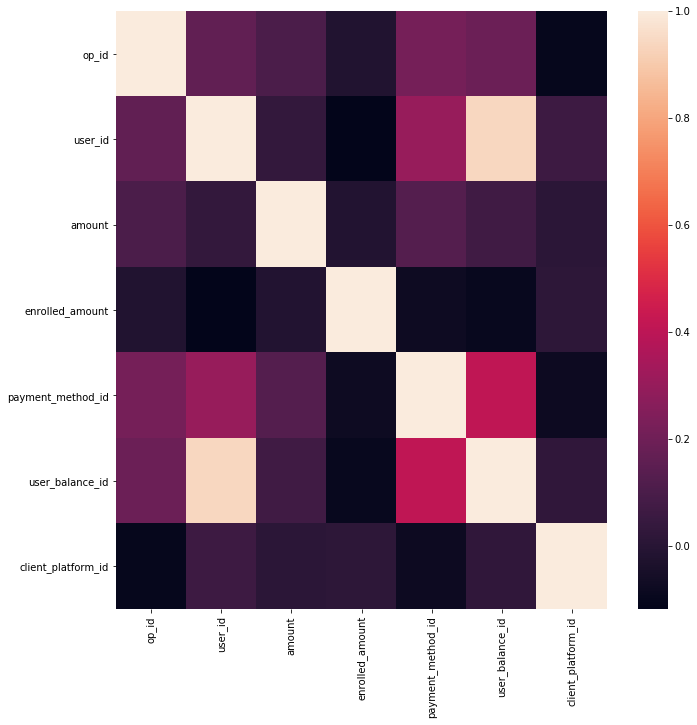

In [71]:
corrmat = visualize_correlation_heatmap(df)

In [72]:
corr_features = correlation(df, 0.8)
len(set(corr_features))

0.9425730634037902 user_balance_id user_id


1

In [73]:
def get_deposits_stats_per_user(ds_deposits_df, _user_id):
    
    ds_deposits = ds_deposits_df[ds_deposits_df.user_id ==_user_id]
    
    user_deposits_stats = {}
    
    user_deposit_cnt =  ds_deposits.shape[0]
    payment_method_cnt = ds_deposits.payment_method_id.shape[0]
    
    
    avg_depostit_amount_usd = round(ds_deposits['enrolled_amount'].mean(),2)
    
    if isnan(avg_depostit_amount_usd) ==True:
        avg_depostit_amount_usd=0

    deposit_currencies_cnt = ds_deposits.currency.shape[0]
    
    client_platforms_cnt = ds_deposits.client_platform_id.shape[0]
    



    user_deposits_stats = {"user_deposit_cnt": user_deposit_cnt
                           , "payment_method_cnt":payment_method_cnt
                           , "avg_depostit_amount_usd":avg_depostit_amount_usd
                           , "deposit_currencies_cnt":deposit_currencies_cnt
                           , "client_platforms_cnt":client_platforms_cnt
                          }
    
    return user_deposits_stats

In [74]:
deposits_feature_set['user_app_stats'] = deposits_feature_set['users'].apply(lambda x: get_deposits_stats_per_user(df, x))

### Формируем единую карту фич на основе всех источников по пользователям

In [75]:
user_positions_stats = positions_feature_set['user_positions_stats']
user_app_stats = appsflyer_feature_set['user_app_stats']
user_events_stats = events_feature_set['user_app_stats']
user_deposits_stats = deposits_feature_set['user_app_stats']

In [76]:
positions_cnt_l = []
instrument_underlying_cnt_l = []
avg_deal_duration_l = []
pnl_sum_l = []
avg_pnl_deal_l = []
avg_deal_volatility_l = []
avg_price_moving_per_deal_l = []
app_installation_cnt_l = []
avg_click_to_install_app_seconds_l = []
avg_created_to_install_app_seconds_l = []
media_resorces_cnt_l = []
client_platform_cnt_l = []
operations_per_user_cnt_l=[]
df_position_created_evt_l=[]
df_open_position_evt_l=[]
df_get_first_candles_evt_l=[]
df_traderoom_deal_put_evt_l=[]
df_get_underlying_list_l=[]
binary_options_open_time_evt_l=[]
get_strike_list_evt_l=[]
traderoom_deal_call_evt_l=[]
app_launch_evt_l=[]
order_created_evt_l=[]
place_order_temp_response_evt_l=[]
get_instruments_evt_l=[]
user_deposit_cnt_l=[]
payment_method_cnt_l=[]
avg_depostit_amount_usd_l=[]
deposit_currencies_cnt_l=[]
client_platforms_cnt_l=[]


for positions_item, app_item, events_item, deposits_item in zip(user_positions_stats,user_app_stats,user_events_stats,user_deposits_stats):
    #print(deposits_item)
    positions_cnt_l.append(positions_item['positions_cnt'])
    instrument_underlying_cnt_l.append(positions_item['instrument_underlying_cnt'])
    avg_deal_duration_l.append(positions_item['avg_deal_duration'])
    pnl_sum_l.append(positions_item['pnl_sum'])
    avg_pnl_deal_l.append(positions_item['avg_pnl_deal'])
    avg_deal_volatility_l.append(positions_item['avg_deal_volatility'])
    avg_price_moving_per_deal_l.append(positions_item['avg_price_moving_per_deal'])
    app_installation_cnt_l.append(app_item['app_installation_cnt'])
    avg_click_to_install_app_seconds_l.append(app_item['avg_click_to_install_app_seconds'])
    avg_created_to_install_app_seconds_l.append(app_item['avg_created_to_install_app_seconds'])
    media_resorces_cnt_l.append(app_item['media_resorces_cnt'])
    client_platform_cnt_l.append(app_item['client_platform_cnt'])
    operations_per_user_cnt_l.append(events_item['operations_per_user_cnt'])
    df_position_created_evt_l.append(events_item['df_position_created_evt'])
    df_open_position_evt_l.append(events_item['df_open_position_evt'])
    df_get_first_candles_evt_l.append(events_item['df_get_first_candles_evt'])
    df_traderoom_deal_put_evt_l.append(events_item['df_traderoom_deal_put_evt'])
    df_get_underlying_list_l.append(events_item['df_get_underlying_list'])
    binary_options_open_time_evt_l.append(events_item['binary_options_open_time_evt'])
    get_strike_list_evt_l.append(events_item['get_strike_list_evt'])
    traderoom_deal_call_evt_l.append(events_item['traderoom_deal_call_evt'])
    app_launch_evt_l.append(events_item['app_launch_evt'])
    order_created_evt_l.append(events_item['order_created_evt'])
    place_order_temp_response_evt_l.append(events_item['place_order_temp_response_evt'])
    get_instruments_evt_l.append(events_item['get_instruments_evt'])
    user_deposit_cnt_l.append(deposits_item['user_deposit_cnt'])
    payment_method_cnt_l.append(deposits_item['payment_method_cnt'])
    avg_depostit_amount_usd_l.append(deposits_item['avg_depostit_amount_usd'])
    deposit_currencies_cnt_l.append(deposits_item['deposit_currencies_cnt'])    
    client_platforms_cnt_l.append(deposits_item['client_platforms_cnt']) 
    


In [77]:
feature_set = positions_feature_set[['users','real_account']]
feature_set = np.array(feature_set)

feature_set= np.insert(feature_set, 2, positions_cnt_l, axis=1)
feature_set= np.insert(feature_set, 3, instrument_underlying_cnt_l, axis=1)
feature_set= np.insert(feature_set, 4, avg_deal_duration_l, axis=1)
feature_set= np.insert(feature_set, 5, pnl_sum_l, axis=1)
feature_set= np.insert(feature_set, 6, avg_pnl_deal_l, axis=1)
feature_set= np.insert(feature_set, 7, avg_deal_volatility_l, axis=1)
feature_set= np.insert(feature_set, 8, avg_price_moving_per_deal_l, axis=1)

feature_set= np.insert(feature_set, 9, app_installation_cnt_l, axis=1)
feature_set= np.insert(feature_set, 10, avg_click_to_install_app_seconds_l, axis=1)
feature_set= np.insert(feature_set, 11, avg_created_to_install_app_seconds_l, axis=1)
feature_set= np.insert(feature_set, 12, media_resorces_cnt_l, axis=1)
feature_set= np.insert(feature_set, 13, client_platform_cnt_l, axis=1)

feature_set= np.insert(feature_set, 14, operations_per_user_cnt_l, axis=1)
feature_set= np.insert(feature_set, 15, df_position_created_evt_l, axis=1)
feature_set= np.insert(feature_set, 16, df_open_position_evt_l, axis=1)
feature_set= np.insert(feature_set, 17, df_get_first_candles_evt_l, axis=1)
feature_set= np.insert(feature_set, 18, df_traderoom_deal_put_evt_l, axis=1)
feature_set= np.insert(feature_set, 19, df_get_underlying_list_l, axis=1)
feature_set= np.insert(feature_set, 20, binary_options_open_time_evt_l, axis=1)
feature_set= np.insert(feature_set, 21, get_strike_list_evt_l, axis=1)
feature_set= np.insert(feature_set, 22, traderoom_deal_call_evt_l, axis=1)
feature_set= np.insert(feature_set, 23, app_launch_evt_l, axis=1)
feature_set= np.insert(feature_set, 24, order_created_evt_l, axis=1)
feature_set= np.insert(feature_set, 25, place_order_temp_response_evt_l, axis=1)
feature_set= np.insert(feature_set, 26, get_instruments_evt_l, axis=1)

feature_set= np.insert(feature_set, 27, user_deposit_cnt_l, axis=1)
feature_set= np.insert(feature_set, 28, payment_method_cnt_l, axis=1)
feature_set= np.insert(feature_set, 29, avg_depostit_amount_usd_l, axis=1)
feature_set= np.insert(feature_set, 30, deposit_currencies_cnt_l, axis=1)
feature_set= np.insert(feature_set, 31, client_platforms_cnt_l, axis=1)


In [78]:
feature_set_df = pd.DataFrame(feature_set)

In [79]:
feature_set_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31
0,124963444,0,9,6,147022,-151540095,-16837788,147022,25337670,7,0,31,1,2,89,1,3,13,6,7,8,33,6,0,0,1,11,0,0,0,0,0
1,105433234,1,307,25,4776,10328713902,33644019,4776,-11044408,5,3503,25,4,2,4308,67,65,1105,136,136,201,2193,109,0,0,62,234,6,6,11554593,6,6
2,143260369,1,791,30,1939,-32173676026,-40674685,1939,-1544,2,45,31,2,1,1229,118,127,72,77,40,0,371,42,12,0,117,41,12,12,22583333,12,12
3,150012217,1,559,26,500,-189944053,-339792,500,5190,3,100042,32,2,2,882,45,42,200,42,43,10,184,21,42,0,49,141,3,3,4839221,3,3
4,150130063,1,370,25,1292,-1886163315,-5097738,1292,65637,2,42,31,2,1,1318,49,54,79,24,105,0,707,27,34,0,59,108,1,1,25000000,1,1
5,108248584,1,5783,21,42,-2842944365910,-491603729,42,2,7,3821,31,4,1,3277,0,382,143,254,144,107,918,223,69,0,398,144,56,56,60282678,56,56
6,59910499,1,185,17,57,-50018722,-270371,57,533,3,29629,32,2,1,299,0,34,22,17,10,0,97,26,2,0,43,9,2,2,7371236,2,2
7,150485509,1,876,26,96,-75189215983,-85832438,96,-222,2,0,32,1,1,2174,52,64,178,81,67,70,1375,75,47,0,69,95,5,5,25601585,5,5
8,82280143,1,1272,94,597361,-5758768179719,-4527333474,597361,-33678429,19,85704,37,4,1,7136,1834,479,1711,332,326,0,115,232,613,0,497,338,6,6,56928392,6,6
9,106145803,1,422,27,338,20826887640,49352814,338,-537,5,450609,25,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,5,5,120000000,5,5


### Очистка карты фич от коррелирующих фич с меньшей значимостью.

In [80]:
df = feature_set_df

In [81]:
print("До очистки количество колонок составляет: {0}".format(df.shape[1]))

До очистки количество колонок составляет: 32


1.0 7 4
0.8293562657067463 20 18
0.8886190924628276 21 14
0.9586862720442937 22 18
0.9997939187080311 25 16
0.8180433976174871 26 17
0.9631036005564676 26 19
0.814286105711284 27 14
0.8747944209240588 27 21
0.814286105711284 28 14
0.8747944209240588 28 21
1.0 28 27
0.814286105711284 30 14
0.8747944209240588 30 21
1.0 30 27
1.0 30 28
0.814286105711284 31 14
0.8747944209240588 31 21
1.0 31 27
1.0 31 28
1.0 31 30


,feature1,feature2,corr
0,16,25,0.999794
1,25,16,0.999794
2,26,19,0.963104
3,19,26,0.963104
4,18,22,0.958686


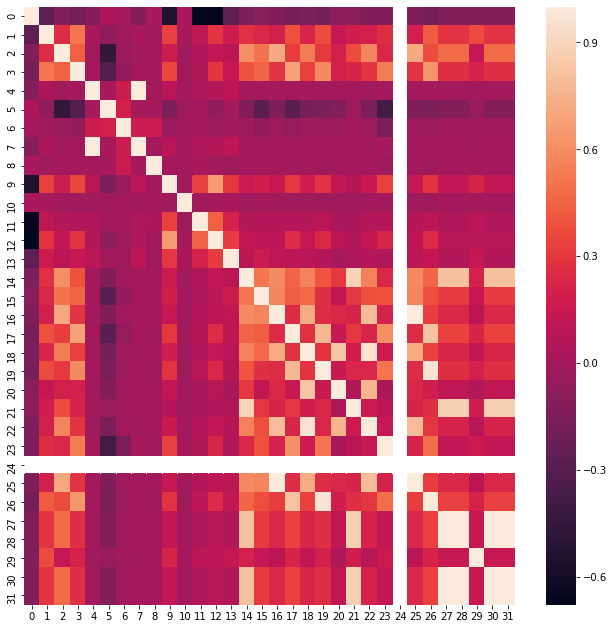

In [82]:
corrmat = visualize_correlation_heatmap(df)

corr_features = correlation(df, 0.8)
len(set(corr_features))

corrmat = df.corr()
corrmat = corrmat.abs().unstack() # absolute value of corr coef
corrmat = corrmat.sort_values(ascending=False)
corrmat = corrmat[corrmat >= 0.8]
corrmat = corrmat[corrmat < 1]
corrmat = pd.DataFrame(corrmat).reset_index()
corrmat.columns = ['feature1', 'feature2', 'corr']
corrmat.head()

In [83]:
correlated_groups = find_correlated_groups(df,corrmat)

found 4 correlated groups
out of 32 total features


In [84]:
df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31
0,124963444,0,9,6,147022,-151540095,-16837788,147022,25337670,7,0,31,1,2,89,1,3,13,6,7,8,33,6,0,0,1,11,0,0,0,0,0
1,105433234,1,307,25,4776,10328713902,33644019,4776,-11044408,5,3503,25,4,2,4308,67,65,1105,136,136,201,2193,109,0,0,62,234,6,6,11554593,6,6
2,143260369,1,791,30,1939,-32173676026,-40674685,1939,-1544,2,45,31,2,1,1229,118,127,72,77,40,0,371,42,12,0,117,41,12,12,22583333,12,12
3,150012217,1,559,26,500,-189944053,-339792,500,5190,3,100042,32,2,2,882,45,42,200,42,43,10,184,21,42,0,49,141,3,3,4839221,3,3
4,150130063,1,370,25,1292,-1886163315,-5097738,1292,65637,2,42,31,2,1,1318,49,54,79,24,105,0,707,27,34,0,59,108,1,1,25000000,1,1
5,108248584,1,5783,21,42,-2842944365910,-491603729,42,2,7,3821,31,4,1,3277,0,382,143,254,144,107,918,223,69,0,398,144,56,56,60282678,56,56
6,59910499,1,185,17,57,-50018722,-270371,57,533,3,29629,32,2,1,299,0,34,22,17,10,0,97,26,2,0,43,9,2,2,7371236,2,2
7,150485509,1,876,26,96,-75189215983,-85832438,96,-222,2,0,32,1,1,2174,52,64,178,81,67,70,1375,75,47,0,69,95,5,5,25601585,5,5
8,82280143,1,1272,94,597361,-5758768179719,-4527333474,597361,-33678429,19,85704,37,4,1,7136,1834,479,1711,332,326,0,115,232,613,0,497,338,6,6,56928392,6,6
9,106145803,1,422,27,338,20826887640,49352814,338,-537,5,450609,25,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,5,5,120000000,5,5


In [85]:
importance_features_list = get_best_correlated_features_from_groups(df,correlated_groups)

Choosing the best feature from group: 16

Choosing the best feature from group: 26

Choosing the best feature from group: 18

Choosing the best feature from group: 14



### Получаем самые важные по значимости фичи из корелляционных групп

In [87]:
importance_features_list

[   feature  importance
 0       25    0.515781
 1       16    0.484219,
    feature  importance
 0       19    0.319367
 1       17    0.385884
 2       26    0.294749,
    feature  importance
 0       22    0.412512
 1       20    0.247295
 2       18    0.340193,
    feature  importance
 0       21    0.024877
 1       31    0.272577
 2       30    0.219365
 3       27    0.206829
 4       28    0.224772
 5       14    0.051580]

In [88]:
#Удаляем из каждой все фичи, и оставляем только одну с самым высоким показателем значимости
feature_set_cleaned = feature_set_df.drop([16, 19,26,20,18,21,30,27,28,14], axis='columns', inplace=False)

In [89]:
print("Таблица фич до очистки от коррелированных фич содержала в себе: {0} колонок, после очистки осталось: {1} колонок".format(feature_set_df.shape[1] ,feature_set_cleaned.shape[1]))

Таблица фич до очистки от коррелированных фич содержала в себе: 32 колонок, после очистки осталось: 22 колонок


#### Формируем демо - выборку

In [90]:
# Cлучайным образом отберем экземпляры из демо выборки в количестве, равном количеству экземпляров выборки с реальным счетом
# для уравновешивания количества семплов в пользователей с демо и реальным счетом 

In [91]:
def get_demo(feature_set_demo, demo_samples_num):

    demo_list = []

    for i, idx in enumerate(np.random.randint(0, len(feature_set_demo), 
                                              size = demo_samples_num)):
        #print(str(i) + " " + str(idx))
        demo_list.append(feature_set_demo.iloc[idx])
        
    
    
    df_demo = pd.DataFrame(demo_list)
    
    return df_demo

In [120]:
feature_set_real = feature_set_cleaned[feature_set_cleaned[1]==1]
demo_samples_num= len(feature_set_real)
feature_set_demo_full = feature_set_cleaned[feature_set_cleaned[1]==0]
feature_set_demo = get_demo(feature_set_demo_full, demo_samples_num)
concatenated_set = pd.concat([feature_set_real, feature_set_demo])

In [121]:
concatenated_set

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,15,17,22,23,24,25,29,31
1,105433234,1,307,25,4776,10328713902,33644019,4776,-11044408,5,3503,25,4,2,67,1105,109,0,0,62,11554593,6
2,143260369,1,791,30,1939,-32173676026,-40674685,1939,-1544,2,45,31,2,1,118,72,42,12,0,117,22583333,12
3,150012217,1,559,26,500,-189944053,-339792,500,5190,3,100042,32,2,2,45,200,21,42,0,49,4839221,3
4,150130063,1,370,25,1292,-1886163315,-5097738,1292,65637,2,42,31,2,1,49,79,27,34,0,59,25000000,1
5,108248584,1,5783,21,42,-2842944365910,-491603729,42,2,7,3821,31,4,1,0,143,223,69,0,398,60282678,56
6,59910499,1,185,17,57,-50018722,-270371,57,533,3,29629,32,2,1,0,22,26,2,0,43,7371236,2
7,150485509,1,876,26,96,-75189215983,-85832438,96,-222,2,0,32,1,1,52,178,75,47,0,69,25601585,5
8,82280143,1,1272,94,597361,-5758768179719,-4527333474,597361,-33678429,19,85704,37,4,1,1834,1711,232,613,0,497,56928392,6
9,106145803,1,422,27,338,20826887640,49352814,338,-537,5,450609,25,4,1,0,0,0,0,0,0,120000000,5
11,138785209,1,2457,29,59,-42212182027,-17180375,59,334,4,0,31,1,1,121,277,358,76,0,423,12470618,7


In [122]:
len(concatenated_set)

392

#### Скейлинг данных

In [123]:
y = np.array(concatenated_set[1])
X = np.array(concatenated_set.drop([0,1], axis='columns', inplace=False))

from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)

#### Разбиваем выборку на тренировочную и тестовую

In [124]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_scaled,y,test_size=0.3, random_state=10)

In [125]:
print("Количество наблюдений в тренировочной выборке: {0}, в тестовой выборке: {1}".format(X_train.shape[0], X_test.shape[0]))

Количество наблюдений в тренировочной выборке: 274, в тестовой выборке: 118


# Machine learning Section

## Classical ML Models

### 1. LinearRegression

In [126]:
from sklearn.linear_model import LinearRegression
lr_clf = LinearRegression()
lr_clf.fit(X_train, y_train)
lr_clf.score(X_test, y_test)

0.15646654442967434

### 2. K-Fold cross validation

In [127]:
'''
K-Fold cross validation
'''
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_val_score

#will randomize samples, for each of the fold have equal distribution
cv= ShuffleSplit(n_splits=5, test_size=0.3, random_state=0)
cross_val_score(LinearRegression(),X,y,cv=cv)

array([-0.37212387, -0.62063327, -0.24297515, -0.41052786, -0.19362864])

### 3. Hyperparameter tuning with GridSearchCV

#### 3.1 LinearRegression, Lasso, DecisionTreeRegressor

In [128]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Lasso
from sklearn.tree import DecisionTreeRegressor

In [129]:
def find_best_model_using_grid_searchcv(X,y):
    algos = {
        'linear_regression': {
            
            'model': LinearRegression(),
            'params':{
                
                'normalize': [True, False]
            }        
        },
        
        'lasso' : {
            
            'model': Lasso(),
            'params': {
                
                'alpha': [1,2],
                'selection': ['random', 'cyclic']
            }
        },
        
        'decision_tree':{
            
            'model': DecisionTreeRegressor(),
            'params':{
                
                'criterion': ['mse', 'friedman_mse'],
                'splitter': ['best', 'random']
                
            }
        }
    }
    
    
    scores = []
    cv = ShuffleSplit(n_splits =5, test_size = 0.3, random_state=0)
    for algo_name, config in algos.items():
        gs = GridSearchCV(config['model'], config['params'], cv=cv, return_train_score= False)
        gs.fit(X,y)
        scores.append({
            
            'model': algo_name, 
            'best_score': gs.best_score_,
            'best_params': gs.best_params_  
        })
    
    return pd.DataFrame(scores, columns=['model', 'best_score', 'best_params'])

#### Подбор параметров и вывод результатов:

In [130]:
find_best_model_using_grid_searchcv(X_scaled, y)

,model,best_score,best_params
0,linear_regression,-0.367981,{'normalize': False}
1,lasso,-0.014020,"{'alpha': 1, 'selection': 'random'}"
2,decision_tree,0.761309,"{'criterion': 'friedman_mse', 'splitter': 'best'}"


Вывод:модели линейной регрессии и lasso обучаются плохо, что естетвенно, тк зависимости не линейные. 
Модель деревьев решений выдает показатель в 75%

#### 3.2 Support vector machines, RandomForestClassifier, LogisticRegression

In [131]:
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV

In [132]:
#Define different candidate models
model_params = {
    'svm':{
        'model': svm.SVC(gamma='auto', probability=True)
        , 'params': {
            
            'svc__C': [1,10,100,1000],
            'svc__kernel': ['rbf', 'linear']
        }
    }
    ,
    
    'random_forest': {
        'model': RandomForestClassifier()
        , 'params':{
            
            'randomforestclassifier__n_estimators':[1,5,10]
        }       
    }
    ,
    
    'logistic_regression':{
        
        'model': LogisticRegression(solver='liblinear', multi_class='auto')
        , 'params':{
            
            'logisticregression__C':[1,5,10]
        }   
    }
}

In [133]:
scores = []
best_estimators = {}
import pandas as pd
for algo, mp in model_params.items():
    pipe = make_pipeline(mp['model'])
    clf = GridSearchCV(pipe, mp['params'], cv=5, return_train_score = False)
    clf.fit(X_train, y_train)
    scores.append({
        
        'model': algo,
        'best_score': clf.best_score_,
        'best_params': clf.best_params_
    })
    best_estimators[algo] = clf.best_estimator_  

#### Подбор параметров и вывод результатов:

In [134]:
df = pd.DataFrame(scores,columns=['model', 'best_score', 'best_params'])
df  

,model,best_score,best_params
0,svm,0.952660,"{'svc__C': 1000, 'svc__kernel': 'linear'}"
1,random_forest,0.956364,{'randomforestclassifier__n_estimators': 10}
2,logistic_regression,0.799663,{'logisticregression__C': 10}


In [135]:
best_estimators

{'svm': Pipeline(memory=None,
          steps=[('svc',
                  SVC(C=1000, break_ties=False, cache_size=200,
                      class_weight=None, coef0=0.0,
                      decision_function_shape='ovr', degree=3, gamma='auto',
                      kernel='linear', max_iter=-1, probability=True,
                      random_state=None, shrinking=True, tol=0.001,
                      verbose=False))],
          verbose=False),
 'random_forest': Pipeline(memory=None,
          steps=[('randomforestclassifier',
                  RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                         class_weight=None, criterion='gini',
                                         max_depth=None, max_features='auto',
                                         max_leaf_nodes=None, max_samples=None,
                                         min_impurity_decrease=0.0,
                                         min_impurity_split=None,
                      

In [136]:
#Evaluating best estimators:

svm_score = best_estimators['svm'].score(X_test, y_test)
random_forest_score = best_estimators['random_forest'].score(X_test, y_test)
logistic_regression_score = best_estimators['logistic_regression'].score(X_test, y_test)

print("SVM: {0} Random Forest: {1} Logistic Regression: {2}".format(svm_score, random_forest_score, logistic_regression_score))

SVM: 0.9491525423728814 Random Forest: 0.940677966101695 Logistic Regression: 0.847457627118644


Вывод: Логистическая регрессия эффективнее в данной задаче, чем линейная, однако значительный прирост точности дают 
    модели случайного леса и метод опорных векторов.

## 2. Deep Learning Models

### 2.1 Artificial Neural Network

In [137]:
epochs = 150

In [138]:
import tensorflow as tf
tf.__version__

# Building the ANN

# Initializing the ANN
ann = tf.keras.models.Sequential()

# Adding the input layer and the first hidden layer
ann.add(tf.keras.layers.Dense(units=20, activation='relu'))

# Adding the second hidden layer
ann.add(tf.keras.layers.Dense(units=10, activation='relu'))

# Adding the output layer
ann.add(tf.keras.layers.Dense(units=1, activation='sigmoid'))

# Part 3 - Training the ANN

# Compiling the ANN
ann.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

# Training the ANN on the Training set and evaluating it on the Test set
train_stats = ann.fit(X_scaled, y, validation_split=0.3, epochs=epochs, batch_size=10)

Epoch 1/150
28/28 [==============================] - 0s 7ms/step - loss: 0.6503 - accuracy: 0.7117 - val_loss: 0.9245 - val_accuracy: 0.0000e+00
Epoch 2/150
28/28 [==============================] - 0s 2ms/step - loss: 0.6131 - accuracy: 0.7153 - val_loss: 1.0516 - val_accuracy: 0.0000e+00
Epoch 3/150
28/28 [==============================] - 0s 2ms/step - loss: 0.5927 - accuracy: 0.7153 - val_loss: 1.1686 - val_accuracy: 0.0000e+00
Epoch 4/150
28/28 [==============================] - 0s 2ms/step - loss: 0.5800 - accuracy: 0.7153 - val_loss: 1.1790 - val_accuracy: 0.0000e+00
Epoch 5/150
28/28 [==============================] - 0s 2ms/step - loss: 0.5715 - accuracy: 0.7153 - val_loss: 1.2048 - val_accuracy: 0.0000e+00
Epoch 6/150
28/28 [==============================] - 0s 2ms/step - loss: 0.5646 - accuracy: 0.7153 - val_loss: 1.2213 - val_accuracy: 0.0000e+00
Epoch 7/150
28/28 [==============================] - 0s 2ms/step - loss: 0.5548 - accuracy: 0.7153 - val_loss: 1.1663 - val_accura

28/28 [==============================] - 0s 2ms/step - loss: 0.2630 - accuracy: 0.8942 - val_loss: 0.5651 - val_accuracy: 0.8136
Epoch 59/150
28/28 [==============================] - 0s 2ms/step - loss: 0.2594 - accuracy: 0.9051 - val_loss: 0.5005 - val_accuracy: 0.8729
Epoch 60/150
28/28 [==============================] - 0s 2ms/step - loss: 0.2539 - accuracy: 0.9051 - val_loss: 0.5241 - val_accuracy: 0.8559
Epoch 61/150
28/28 [==============================] - 0s 2ms/step - loss: 0.2515 - accuracy: 0.9197 - val_loss: 0.4575 - val_accuracy: 0.8814
Epoch 62/150
28/28 [==============================] - 0s 2ms/step - loss: 0.2485 - accuracy: 0.9088 - val_loss: 0.4935 - val_accuracy: 0.8729
Epoch 63/150
28/28 [==============================] - 0s 2ms/step - loss: 0.2446 - accuracy: 0.9124 - val_loss: 0.4813 - val_accuracy: 0.8814
Epoch 64/150
28/28 [==============================] - 0s 2ms/step - loss: 0.2444 - accuracy: 0.8978 - val_loss: 0.5028 - val_accuracy: 0.8729
Epoch 65/150
28/28 

Epoch 116/150
28/28 [==============================] - 0s 3ms/step - loss: 0.1302 - accuracy: 0.9562 - val_loss: 0.3912 - val_accuracy: 0.9322
Epoch 117/150
28/28 [==============================] - 0s 2ms/step - loss: 0.1301 - accuracy: 0.9562 - val_loss: 0.3352 - val_accuracy: 0.9407
Epoch 118/150
28/28 [==============================] - 0s 2ms/step - loss: 0.1293 - accuracy: 0.9599 - val_loss: 0.4196 - val_accuracy: 0.9153
Epoch 119/150
28/28 [==============================] - 0s 2ms/step - loss: 0.1330 - accuracy: 0.9562 - val_loss: 0.3217 - val_accuracy: 0.9407
Epoch 120/150
28/28 [==============================] - 0s 2ms/step - loss: 0.1298 - accuracy: 0.9562 - val_loss: 0.3443 - val_accuracy: 0.9407
Epoch 121/150
28/28 [==============================] - 0s 2ms/step - loss: 0.1277 - accuracy: 0.9599 - val_loss: 0.3718 - val_accuracy: 0.9322
Epoch 122/150
28/28 [==============================] - 0s 2ms/step - loss: 0.1257 - accuracy: 0.9562 - val_loss: 0.3947 - val_accuracy: 0.9322

In [139]:
import keras
from tensorflow.keras.models import load_model
ann.save('ann.h5')

In [140]:
#Load model
model = load_model('ann.h5')

In [141]:
def evaluating_set(model, model_name):
    
    print(model_name + ':')
    print('\n')
    model.evaluate(test_set)
    model.evaluate(training_set)
    print('\n')

In [142]:
def draw_cm(cm):
    import seaborn as sn
    plt.figure(figsize = (7,5))
    sn.heatmap(cm,annot=True, fmt="d")
    plt.xlabel('Predicted')
    plt.ylabel('Truth')

In [143]:
def get_accuracy_graph(epochs_p, train_stats):

    history = train_stats.history
    accuracy = history["accuracy"]
    validation_accuracy = history["val_accuracy"]
    epochs = range(1, epochs_p + 1)

    plt.plot(epochs, accuracy, "b", label="Accuracy")
    plt.plot(epochs, validation_accuracy, "r", label="Validation Accuracy")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.title("Accuracy Graphs")
    plt.show()

In [144]:
def get_loss_graph(epochs_p, train_stats):

    history = train_stats.history
    loss = history["loss"]
    validation_loss = history["val_loss"]
    epochs = range(1, epochs_p + 1)

    plt.plot(epochs, loss, "b", label="Loss")
    plt.plot(epochs, validation_loss, "r", label="Validation Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.title("Loss Graphs")
    plt.show()

#### Расчет метрик

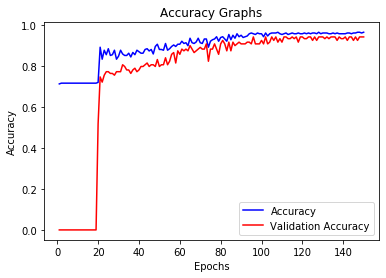

In [145]:
get_accuracy_graph(epochs, train_stats)

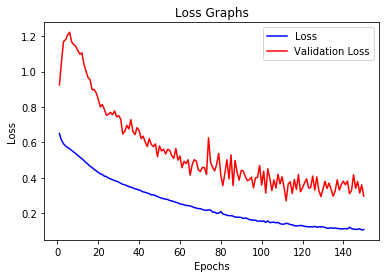

In [146]:
get_loss_graph(epochs, train_stats)

#### Оценка модели методом evaluate

In [147]:
model.evaluate(X_test, y_test, verbose=0)

[0.16504763066768646, 0.9661017060279846]

#### Отчет по метрикам (Classification report)

In [148]:
from sklearn.metrics import classification_report
predicted = model.predict(X_test)
report = classification_report(y_test, predicted.round())
print(report)
#X_train, X_test

              precision    recall  f1-score   support

           0       0.98      0.94      0.96        54
           1       0.95      0.98      0.97        64

    accuracy                           0.97       118
   macro avg       0.97      0.96      0.97       118
weighted avg       0.97      0.97      0.97       118



In [149]:
#Вывод результатов предсказания
for p, y in zip(predicted,y_test):
    print("p: {0} y: {1}".format(p,y))

p: [0.04970193] y: 0
p: [0.07684621] y: 0
p: [0.09050143] y: 0
p: [0.07151589] y: 0
p: [0.04751921] y: 0
p: [0.11115685] y: 0
p: [0.0386233] y: 0
p: [1.] y: 1
p: [0.04893377] y: 0
p: [0.9996321] y: 1
p: [0.97383046] y: 1
p: [0.9415293] y: 1
p: [0.04979491] y: 0
p: [0.9907248] y: 0
p: [0.9987974] y: 1
p: [1.] y: 1
p: [0.9951637] y: 1
p: [0.99764395] y: 1
p: [1.] y: 1
p: [1.] y: 1
p: [0.04784] y: 0
p: [0.04494545] y: 0
p: [0.99732804] y: 1
p: [0.04147014] y: 0
p: [1.] y: 1
p: [1.] y: 1
p: [0.7957534] y: 1
p: [0.04808742] y: 0
p: [0.04779798] y: 0
p: [0.99585783] y: 1
p: [1.] y: 1
p: [0.04641289] y: 0
p: [0.05077219] y: 0
p: [1.] y: 1
p: [0.0484418] y: 0
p: [0.04869735] y: 0
p: [0.07165846] y: 0
p: [0.9836358] y: 1
p: [0.9999846] y: 1
p: [0.07036987] y: 0
p: [0.93065065] y: 1
p: [0.97946554] y: 1
p: [0.9907248] y: 0
p: [0.07677621] y: 0
p: [0.03372702] y: 0
p: [0.82466507] y: 1
p: [1.] y: 1
p: [0.11878952] y: 0
p: [0.39922917] y: 0
p: [0.0486927] y: 0
p: [1.] y: 1
p: [1.] y: 1
p: [0.99998

#### Confusion_matrix

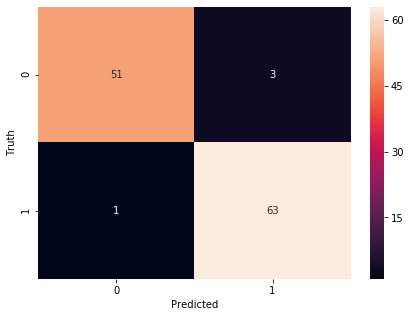

In [150]:
from sklearn.metrics import confusion_matrix
matrix = confusion_matrix(y_test, predicted.round())
draw_cm(matrix)

### 2.2 Evaluate the Performance Of Deep Learning Models with StratifiedKFold cross validation

In [151]:
y = np.array(concatenated_set[1])
X = np.array(concatenated_set.drop([0,1], axis='columns', inplace=False))

from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)

In [152]:
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import StratifiedKFold
import numpy

# fix random seed for reproducibility
seed = 7
X= X_scaled
Y = y
# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=seed)
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
    model = Sequential()
    model.add(Dense(20, input_dim=X_scaled.shape[1], activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    # Compile model
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    # Fit the model
    model.fit(X[train], Y[train], epochs=150, batch_size=10, verbose=0)
    # evaluate the model
    scores = model.evaluate(X[test], Y[test], verbose=0)
    print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)

accuracy: 97.50%
accuracy: 97.50%
accuracy: 94.87%
accuracy: 92.31%
accuracy: 94.87%
accuracy: 97.44%
accuracy: 97.44%
accuracy: 92.31%
accuracy: 97.44%
accuracy: 97.44%


Average Accuracy: 95.91% (+/- 2.06%)
Accuracy graph during kfold neural network validation: 


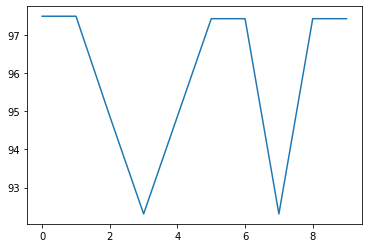

In [153]:
print("Average Accuracy: %.2f%% (+/- %.2f%%)" % (numpy.mean(cvscores), numpy.std(cvscores)))
print("Accuracy graph during kfold neural network validation: ")
plt.plot(cvscores)

Выводы: показатели точности достаточно высокие даже на тестовой выборке, которые предоставляет нейросеть.
Кросвалидация в нейросети выдает показатели точности как правило выше 90%

### 2.3 Рекуррентная нейросеть (LSTM)

Представим данные по каждому наблюдению в виде последовательности

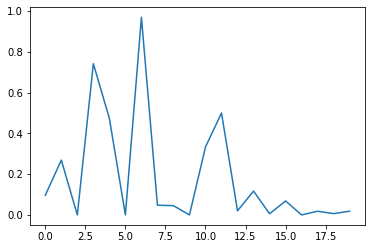

In [222]:
plt.plot(X_scaled[2])

#### Получаем датасет

In [326]:
y = np.array(concatenated_set[1])
X = np.array(concatenated_set.drop([0,1], axis='columns', inplace=False))

from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)

In [327]:
#Разбиваем датасет на тренировочный и тестовый
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_scaled,y,test_size=0.3, random_state=10)

In [328]:
# Reshaping
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

In [334]:
X_test.shape

(118, 20, 1)

#### Building LSTM network classifier

In [371]:
# Importing the Keras libraries and packages
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout

In [372]:
#Параметры
epochs = 1000

In [391]:
# Initialising the RNN
lstm = Sequential()

# Adding the first LSTM layer and some Dropout regularisation
lstm.add(LSTM(units = 20, return_sequences = True, input_shape = (X_train.shape[1], 1)))
#lstm.add(Dropout(0.2))

# Adding a second LSTM layer and some Dropout regularisation
lstm.add(LSTM(units = 20, return_sequences = True))
#lstm.add(Dropout(0.2))

# Adding a third LSTM layer and some Dropout regularisation
lstm.add(LSTM(units = 20, return_sequences = True))
#lstm.add(Dropout(0.2))

# Adding a fourth LSTM layer and some Dropout regularisation
lstm.add(LSTM(units = 20))
#lstm.add(Dropout(0.2))

# Adding the output layer
lstm.add(Dense(units = 1))

# Compiling the RNN
lstm.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

In [392]:
# Fitting the RNN to the Training set
#regressor.fit(X_train, y_train, epochs = train_epochs, batch_size = 32)
history = lstm.fit(X_train, y_train, epochs=epochs, 
                    validation_data=(X_test, y_test))

Epoch 1/1000
9/9 [==============================] - 2s 172ms/step - loss: 1.2788 - accuracy: 0.5182 - val_loss: 0.8823 - val_accuracy: 0.4576
Epoch 2/1000
9/9 [==============================] - 0s 28ms/step - loss: 0.6956 - accuracy: 0.5949 - val_loss: 0.6498 - val_accuracy: 0.5424
Epoch 3/1000
9/9 [==============================] - 0s 28ms/step - loss: 0.6862 - accuracy: 0.4818 - val_loss: 0.6414 - val_accuracy: 0.5424
Epoch 4/1000
9/9 [==============================] - 0s 25ms/step - loss: 0.6540 - accuracy: 0.6788 - val_loss: 0.6718 - val_accuracy: 0.5424
Epoch 5/1000
9/9 [==============================] - 0s 25ms/step - loss: 0.6630 - accuracy: 0.5803 - val_loss: 0.6602 - val_accuracy: 0.6186
Epoch 6/1000
9/9 [==============================] - 0s 25ms/step - loss: 0.6551 - accuracy: 0.6168 - val_loss: 0.6337 - val_accuracy: 0.5508
Epoch 7/1000
9/9 [==============================] - 0s 27ms/step - loss: 0.6499 - accuracy: 0.5000 - val_loss: 0.6342 - val_accuracy: 0.7712
Epoch 8/1000

Epoch 59/1000
9/9 [==============================] - 0s 28ms/step - loss: 0.5121 - accuracy: 0.7518 - val_loss: 0.6605 - val_accuracy: 0.8136
Epoch 60/1000
9/9 [==============================] - 0s 24ms/step - loss: 0.6417 - accuracy: 0.7774 - val_loss: 0.6947 - val_accuracy: 0.7542
Epoch 61/1000
9/9 [==============================] - 0s 26ms/step - loss: 0.5583 - accuracy: 0.7409 - val_loss: 0.7754 - val_accuracy: 0.7966
Epoch 62/1000
9/9 [==============================] - 0s 24ms/step - loss: 0.6738 - accuracy: 0.7080 - val_loss: 0.9834 - val_accuracy: 0.4661
Epoch 63/1000
9/9 [==============================] - 0s 31ms/step - loss: 0.7765 - accuracy: 0.5182 - val_loss: 0.7284 - val_accuracy: 0.5339
Epoch 64/1000
9/9 [==============================] - 0s 27ms/step - loss: 0.7316 - accuracy: 0.4307 - val_loss: 0.7218 - val_accuracy: 0.4576
Epoch 65/1000
9/9 [==============================] - 0s 26ms/step - loss: 0.7035 - accuracy: 0.5182 - val_loss: 0.7079 - val_accuracy: 0.4576
Epoch 

9/9 [==============================] - 0s 27ms/step - loss: 0.6939 - accuracy: 0.5182 - val_loss: 0.6985 - val_accuracy: 0.4576
Epoch 117/1000
9/9 [==============================] - 0s 45ms/step - loss: 0.6938 - accuracy: 0.5182 - val_loss: 0.6979 - val_accuracy: 0.4576
Epoch 118/1000
9/9 [==============================] - 0s 29ms/step - loss: 0.6938 - accuracy: 0.5182 - val_loss: 0.6971 - val_accuracy: 0.4576
Epoch 119/1000
9/9 [==============================] - 0s 30ms/step - loss: 0.6941 - accuracy: 0.5182 - val_loss: 0.6966 - val_accuracy: 0.4576
Epoch 120/1000
9/9 [==============================] - 0s 28ms/step - loss: 0.6941 - accuracy: 0.5182 - val_loss: 0.6978 - val_accuracy: 0.4576
Epoch 121/1000
9/9 [==============================] - 0s 27ms/step - loss: 0.6938 - accuracy: 0.5182 - val_loss: 0.6976 - val_accuracy: 0.4576
Epoch 122/1000
9/9 [==============================] - 0s 26ms/step - loss: 0.6940 - accuracy: 0.5182 - val_loss: 0.6993 - val_accuracy: 0.4576
Epoch 123/1000

9/9 [==============================] - 0s 26ms/step - loss: 0.6862 - accuracy: 0.5328 - val_loss: 0.6943 - val_accuracy: 0.4661
Epoch 174/1000
9/9 [==============================] - 0s 24ms/step - loss: 0.6844 - accuracy: 0.5328 - val_loss: 0.6906 - val_accuracy: 0.4661
Epoch 175/1000
9/9 [==============================] - 0s 30ms/step - loss: 0.6853 - accuracy: 0.5912 - val_loss: 0.6869 - val_accuracy: 0.5424
Epoch 176/1000
9/9 [==============================] - 0s 26ms/step - loss: 0.6839 - accuracy: 0.5766 - val_loss: 0.6926 - val_accuracy: 0.4661
Epoch 177/1000
9/9 [==============================] - 0s 25ms/step - loss: 0.6836 - accuracy: 0.5547 - val_loss: 0.6888 - val_accuracy: 0.4746
Epoch 178/1000
9/9 [==============================] - 0s 27ms/step - loss: 0.6823 - accuracy: 0.5985 - val_loss: 0.6861 - val_accuracy: 0.5000
Epoch 179/1000
9/9 [==============================] - 0s 26ms/step - loss: 0.6811 - accuracy: 0.5766 - val_loss: 0.6886 - val_accuracy: 0.4661
Epoch 180/1000

9/9 [==============================] - 0s 28ms/step - loss: 0.5280 - accuracy: 0.7226 - val_loss: 0.7064 - val_accuracy: 0.8136
Epoch 231/1000
9/9 [==============================] - 0s 28ms/step - loss: 0.5770 - accuracy: 0.7117 - val_loss: 0.5960 - val_accuracy: 0.6356
Epoch 232/1000
9/9 [==============================] - 0s 28ms/step - loss: 0.5593 - accuracy: 0.7044 - val_loss: 0.6952 - val_accuracy: 0.7966
Epoch 233/1000
9/9 [==============================] - 0s 33ms/step - loss: 0.5687 - accuracy: 0.7737 - val_loss: 0.5184 - val_accuracy: 0.7542
Epoch 234/1000
9/9 [==============================] - 0s 25ms/step - loss: 0.5090 - accuracy: 0.7555 - val_loss: 0.6948 - val_accuracy: 0.7712
Epoch 235/1000
9/9 [==============================] - 0s 26ms/step - loss: 0.4998 - accuracy: 0.7555 - val_loss: 0.6869 - val_accuracy: 0.7797
Epoch 236/1000
9/9 [==============================] - 0s 26ms/step - loss: 0.5509 - accuracy: 0.7482 - val_loss: 0.6363 - val_accuracy: 0.7627
Epoch 237/1000

9/9 [==============================] - 0s 27ms/step - loss: 0.5297 - accuracy: 0.7810 - val_loss: 0.5787 - val_accuracy: 0.7966
Epoch 288/1000
9/9 [==============================] - 0s 26ms/step - loss: 0.5261 - accuracy: 0.7518 - val_loss: 0.5740 - val_accuracy: 0.7966
Epoch 289/1000
9/9 [==============================] - 0s 24ms/step - loss: 0.5110 - accuracy: 0.7701 - val_loss: 0.6463 - val_accuracy: 0.8136
Epoch 290/1000
9/9 [==============================] - 0s 30ms/step - loss: 0.6918 - accuracy: 0.7263 - val_loss: 1.2334 - val_accuracy: 0.4661
Epoch 291/1000
9/9 [==============================] - 0s 23ms/step - loss: 0.8962 - accuracy: 0.5292 - val_loss: 0.7386 - val_accuracy: 0.4576
Epoch 292/1000
9/9 [==============================] - 0s 25ms/step - loss: 0.6905 - accuracy: 0.5328 - val_loss: 0.6909 - val_accuracy: 0.5424
Epoch 293/1000
9/9 [==============================] - 0s 23ms/step - loss: 0.7033 - accuracy: 0.4781 - val_loss: 0.6916 - val_accuracy: 0.5424
Epoch 294/1000

9/9 [==============================] - 0s 25ms/step - loss: 0.6935 - accuracy: 0.5182 - val_loss: 0.6992 - val_accuracy: 0.4576
Epoch 345/1000
9/9 [==============================] - 0s 26ms/step - loss: 0.6931 - accuracy: 0.5182 - val_loss: 0.6975 - val_accuracy: 0.4576
Epoch 346/1000
9/9 [==============================] - 0s 30ms/step - loss: 0.6927 - accuracy: 0.5182 - val_loss: 0.6977 - val_accuracy: 0.4576
Epoch 347/1000
9/9 [==============================] - 0s 25ms/step - loss: 0.6927 - accuracy: 0.5182 - val_loss: 0.6985 - val_accuracy: 0.4576
Epoch 348/1000
9/9 [==============================] - 0s 24ms/step - loss: 0.6929 - accuracy: 0.5219 - val_loss: 0.6978 - val_accuracy: 0.4576
Epoch 349/1000
9/9 [==============================] - 0s 29ms/step - loss: 0.6928 - accuracy: 0.5219 - val_loss: 0.6981 - val_accuracy: 0.4576
Epoch 350/1000
9/9 [==============================] - 0s 22ms/step - loss: 0.6936 - accuracy: 0.5219 - val_loss: 0.6967 - val_accuracy: 0.4576
Epoch 351/1000

9/9 [==============================] - 0s 25ms/step - loss: 0.6911 - accuracy: 0.5219 - val_loss: 0.6971 - val_accuracy: 0.4576
Epoch 402/1000
9/9 [==============================] - 0s 28ms/step - loss: 0.6907 - accuracy: 0.5219 - val_loss: 0.6964 - val_accuracy: 0.4576
Epoch 403/1000
9/9 [==============================] - 0s 22ms/step - loss: 0.6913 - accuracy: 0.5219 - val_loss: 0.6987 - val_accuracy: 0.4576
Epoch 404/1000
9/9 [==============================] - 0s 22ms/step - loss: 0.6907 - accuracy: 0.5292 - val_loss: 0.6951 - val_accuracy: 0.4661
Epoch 405/1000
9/9 [==============================] - 0s 23ms/step - loss: 0.6909 - accuracy: 0.5365 - val_loss: 0.6943 - val_accuracy: 0.4661
Epoch 406/1000
9/9 [==============================] - 0s 29ms/step - loss: 0.6895 - accuracy: 0.5292 - val_loss: 0.6980 - val_accuracy: 0.4576
Epoch 407/1000
9/9 [==============================] - 0s 24ms/step - loss: 0.6901 - accuracy: 0.5219 - val_loss: 0.7014 - val_accuracy: 0.4576
Epoch 408/1000

9/9 [==============================] - 0s 26ms/step - loss: 0.5123 - accuracy: 0.7664 - val_loss: 0.5110 - val_accuracy: 0.7712
Epoch 459/1000
9/9 [==============================] - 0s 25ms/step - loss: 0.5663 - accuracy: 0.6752 - val_loss: 0.7968 - val_accuracy: 0.5424
Epoch 460/1000
9/9 [==============================] - 0s 22ms/step - loss: 0.7034 - accuracy: 0.5876 - val_loss: 0.6471 - val_accuracy: 0.5932
Epoch 461/1000
9/9 [==============================] - 0s 22ms/step - loss: 0.6237 - accuracy: 0.6533 - val_loss: 0.6558 - val_accuracy: 0.5932
Epoch 462/1000
9/9 [==============================] - 0s 22ms/step - loss: 0.6328 - accuracy: 0.6715 - val_loss: 0.6517 - val_accuracy: 0.5932
Epoch 463/1000
9/9 [==============================] - 0s 25ms/step - loss: 0.6239 - accuracy: 0.7226 - val_loss: 0.6322 - val_accuracy: 0.6864
Epoch 464/1000
9/9 [==============================] - 0s 32ms/step - loss: 0.5994 - accuracy: 0.7336 - val_loss: 0.6125 - val_accuracy: 0.6186
Epoch 465/1000

9/9 [==============================] - 0s 27ms/step - loss: 0.6944 - accuracy: 0.5182 - val_loss: 0.6982 - val_accuracy: 0.4576
Epoch 516/1000
9/9 [==============================] - 0s 26ms/step - loss: 0.6943 - accuracy: 0.5182 - val_loss: 0.6984 - val_accuracy: 0.4576
Epoch 517/1000
9/9 [==============================] - 0s 27ms/step - loss: 0.6945 - accuracy: 0.5182 - val_loss: 0.6966 - val_accuracy: 0.4576
Epoch 518/1000
9/9 [==============================] - 0s 22ms/step - loss: 0.6946 - accuracy: 0.5182 - val_loss: 0.6971 - val_accuracy: 0.4576
Epoch 519/1000
9/9 [==============================] - 0s 25ms/step - loss: 0.6949 - accuracy: 0.5182 - val_loss: 0.6989 - val_accuracy: 0.4576
Epoch 520/1000
9/9 [==============================] - 0s 23ms/step - loss: 0.6940 - accuracy: 0.5182 - val_loss: 0.6973 - val_accuracy: 0.4576
Epoch 521/1000
9/9 [==============================] - 0s 22ms/step - loss: 0.6940 - accuracy: 0.5182 - val_loss: 0.6969 - val_accuracy: 0.4576
Epoch 522/1000

9/9 [==============================] - 0s 24ms/step - loss: 0.6919 - accuracy: 0.5219 - val_loss: 0.6984 - val_accuracy: 0.4576
Epoch 573/1000
9/9 [==============================] - 0s 21ms/step - loss: 0.6927 - accuracy: 0.5219 - val_loss: 0.7010 - val_accuracy: 0.4576
Epoch 574/1000
9/9 [==============================] - 0s 23ms/step - loss: 0.6922 - accuracy: 0.5219 - val_loss: 0.7001 - val_accuracy: 0.4576
Epoch 575/1000
9/9 [==============================] - 0s 24ms/step - loss: 0.6922 - accuracy: 0.5219 - val_loss: 0.6965 - val_accuracy: 0.4576
Epoch 576/1000
9/9 [==============================] - 0s 22ms/step - loss: 0.6919 - accuracy: 0.5219 - val_loss: 0.6964 - val_accuracy: 0.4576
Epoch 577/1000
9/9 [==============================] - 0s 22ms/step - loss: 0.6926 - accuracy: 0.5219 - val_loss: 0.6950 - val_accuracy: 0.4576
Epoch 578/1000
9/9 [==============================] - 0s 27ms/step - loss: 0.6925 - accuracy: 0.5219 - val_loss: 0.6983 - val_accuracy: 0.4576
Epoch 579/1000

9/9 [==============================] - 0s 25ms/step - loss: 0.6904 - accuracy: 0.5255 - val_loss: 0.6964 - val_accuracy: 0.4576
Epoch 630/1000
9/9 [==============================] - 0s 23ms/step - loss: 0.6902 - accuracy: 0.5255 - val_loss: 0.6972 - val_accuracy: 0.4576
Epoch 631/1000
9/9 [==============================] - 0s 27ms/step - loss: 0.6910 - accuracy: 0.5255 - val_loss: 0.6997 - val_accuracy: 0.4576
Epoch 632/1000
9/9 [==============================] - 0s 23ms/step - loss: 0.6901 - accuracy: 0.5255 - val_loss: 0.6967 - val_accuracy: 0.4576
Epoch 633/1000
9/9 [==============================] - 0s 22ms/step - loss: 0.6906 - accuracy: 0.5255 - val_loss: 0.6973 - val_accuracy: 0.4576
Epoch 634/1000
9/9 [==============================] - 0s 25ms/step - loss: 0.6901 - accuracy: 0.5255 - val_loss: 0.6980 - val_accuracy: 0.4576
Epoch 635/1000
9/9 [==============================] - 0s 24ms/step - loss: 0.6903 - accuracy: 0.5255 - val_loss: 0.7000 - val_accuracy: 0.4576
Epoch 636/1000

9/9 [==============================] - 0s 23ms/step - loss: 0.6906 - accuracy: 0.5328 - val_loss: 0.6939 - val_accuracy: 0.4661
Epoch 687/1000
9/9 [==============================] - 0s 23ms/step - loss: 0.6889 - accuracy: 0.5292 - val_loss: 0.6964 - val_accuracy: 0.4576
Epoch 688/1000
9/9 [==============================] - 0s 23ms/step - loss: 0.6885 - accuracy: 0.5255 - val_loss: 0.7011 - val_accuracy: 0.4576
Epoch 689/1000
9/9 [==============================] - 0s 22ms/step - loss: 0.6906 - accuracy: 0.5255 - val_loss: 0.7025 - val_accuracy: 0.4576
Epoch 690/1000
9/9 [==============================] - 0s 22ms/step - loss: 0.6887 - accuracy: 0.5255 - val_loss: 0.6991 - val_accuracy: 0.4576
Epoch 691/1000
9/9 [==============================] - 0s 22ms/step - loss: 0.6887 - accuracy: 0.5255 - val_loss: 0.6951 - val_accuracy: 0.4576
Epoch 692/1000
9/9 [==============================] - 0s 26ms/step - loss: 0.6891 - accuracy: 0.5365 - val_loss: 0.6948 - val_accuracy: 0.4576
Epoch 693/1000

9/9 [==============================] - 0s 32ms/step - loss: 0.6872 - accuracy: 0.5438 - val_loss: 0.6959 - val_accuracy: 0.4661
Epoch 744/1000
9/9 [==============================] - 0s 28ms/step - loss: 0.6870 - accuracy: 0.5328 - val_loss: 0.7004 - val_accuracy: 0.4576
Epoch 745/1000
9/9 [==============================] - 0s 30ms/step - loss: 0.6870 - accuracy: 0.5328 - val_loss: 0.6979 - val_accuracy: 0.4661
Epoch 746/1000
9/9 [==============================] - 0s 30ms/step - loss: 0.6889 - accuracy: 0.5803 - val_loss: 0.6923 - val_accuracy: 0.4915
Epoch 747/1000
9/9 [==============================] - 0s 31ms/step - loss: 0.6886 - accuracy: 0.5438 - val_loss: 0.7015 - val_accuracy: 0.4576
Epoch 748/1000
9/9 [==============================] - 0s 26ms/step - loss: 0.6879 - accuracy: 0.5292 - val_loss: 0.6987 - val_accuracy: 0.4661
Epoch 749/1000
9/9 [==============================] - 0s 25ms/step - loss: 0.6864 - accuracy: 0.5328 - val_loss: 0.6971 - val_accuracy: 0.4661
Epoch 750/1000

9/9 [==============================] - 0s 25ms/step - loss: 0.6740 - accuracy: 0.4818 - val_loss: 0.6804 - val_accuracy: 0.8475
Epoch 801/1000
9/9 [==============================] - 0s 25ms/step - loss: 0.6644 - accuracy: 0.6715 - val_loss: 0.6874 - val_accuracy: 0.5000
Epoch 802/1000
9/9 [==============================] - 0s 35ms/step - loss: 0.6666 - accuracy: 0.5657 - val_loss: 0.6985 - val_accuracy: 0.4746
Epoch 803/1000
9/9 [==============================] - 0s 40ms/step - loss: 0.6612 - accuracy: 0.5766 - val_loss: 0.6832 - val_accuracy: 0.5169
Epoch 804/1000
9/9 [==============================] - 0s 25ms/step - loss: 0.6571 - accuracy: 0.6095 - val_loss: 0.6772 - val_accuracy: 0.5339
Epoch 805/1000
9/9 [==============================] - 0s 27ms/step - loss: 0.6534 - accuracy: 0.6241 - val_loss: 0.6748 - val_accuracy: 0.5254
Epoch 806/1000
9/9 [==============================] - 0s 25ms/step - loss: 0.6459 - accuracy: 0.6350 - val_loss: 0.6660 - val_accuracy: 0.5847
Epoch 807/1000

9/9 [==============================] - 0s 26ms/step - loss: 0.5562 - accuracy: 0.8066 - val_loss: 0.4520 - val_accuracy: 0.7627
Epoch 858/1000
9/9 [==============================] - 0s 26ms/step - loss: 0.5412 - accuracy: 0.7372 - val_loss: 0.5396 - val_accuracy: 0.6864
Epoch 859/1000
9/9 [==============================] - 0s 25ms/step - loss: 0.4876 - accuracy: 0.7810 - val_loss: 0.4670 - val_accuracy: 0.8051
Epoch 860/1000
9/9 [==============================] - 0s 27ms/step - loss: 0.4764 - accuracy: 0.8139 - val_loss: 0.4533 - val_accuracy: 0.7712
Epoch 861/1000
9/9 [==============================] - 0s 29ms/step - loss: 0.4786 - accuracy: 0.7664 - val_loss: 0.4077 - val_accuracy: 0.8644
Epoch 862/1000
9/9 [==============================] - 0s 24ms/step - loss: 0.5575 - accuracy: 0.7993 - val_loss: 0.4307 - val_accuracy: 0.7797
Epoch 863/1000
9/9 [==============================] - 0s 23ms/step - loss: 0.4834 - accuracy: 0.7701 - val_loss: 0.4007 - val_accuracy: 0.8475
Epoch 864/1000

9/9 [==============================] - 0s 23ms/step - loss: 0.4563 - accuracy: 0.7920 - val_loss: 0.4137 - val_accuracy: 0.8136
Epoch 915/1000
9/9 [==============================] - 0s 30ms/step - loss: 0.4680 - accuracy: 0.7847 - val_loss: 0.3942 - val_accuracy: 0.8475
Epoch 916/1000
9/9 [==============================] - 0s 28ms/step - loss: 0.4545 - accuracy: 0.7883 - val_loss: 0.4004 - val_accuracy: 0.8475
Epoch 917/1000
9/9 [==============================] - 0s 24ms/step - loss: 0.4458 - accuracy: 0.7920 - val_loss: 0.3988 - val_accuracy: 0.8390
Epoch 918/1000
9/9 [==============================] - 0s 24ms/step - loss: 0.4336 - accuracy: 0.8212 - val_loss: 0.4015 - val_accuracy: 0.8475
Epoch 919/1000
9/9 [==============================] - 0s 22ms/step - loss: 0.4725 - accuracy: 0.7810 - val_loss: 0.3927 - val_accuracy: 0.8475
Epoch 920/1000
9/9 [==============================] - 0s 27ms/step - loss: 0.4352 - accuracy: 0.8212 - val_loss: 0.3891 - val_accuracy: 0.8475
Epoch 921/1000

9/9 [==============================] - 0s 23ms/step - loss: 0.5066 - accuracy: 0.7664 - val_loss: 0.4706 - val_accuracy: 0.7797
Epoch 972/1000
9/9 [==============================] - 0s 29ms/step - loss: 0.4545 - accuracy: 0.7956 - val_loss: 0.4348 - val_accuracy: 0.8220
Epoch 973/1000
9/9 [==============================] - 0s 29ms/step - loss: 0.4713 - accuracy: 0.7883 - val_loss: 0.3934 - val_accuracy: 0.8644
Epoch 974/1000
9/9 [==============================] - 0s 30ms/step - loss: 0.4422 - accuracy: 0.8102 - val_loss: 0.3909 - val_accuracy: 0.8644
Epoch 975/1000
9/9 [==============================] - 0s 36ms/step - loss: 0.4368 - accuracy: 0.8102 - val_loss: 0.3939 - val_accuracy: 0.8559
Epoch 976/1000
9/9 [==============================] - 0s 33ms/step - loss: 0.4661 - accuracy: 0.7993 - val_loss: 0.4017 - val_accuracy: 0.8305
Epoch 977/1000
9/9 [==============================] - 0s 33ms/step - loss: 0.5124 - accuracy: 0.7883 - val_loss: 0.4276 - val_accuracy: 0.7966
Epoch 978/1000

#### Рассчет метрик

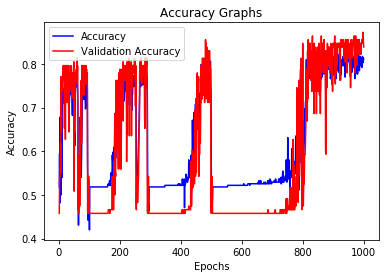

In [393]:
get_accuracy_graph(epochs, history)

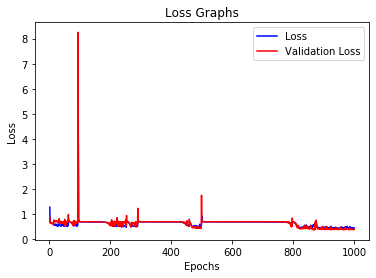

In [394]:
get_loss_graph(epochs, history)

#### Отчет по метрикам (Classification report)

In [395]:
from sklearn.metrics import classification_report
predicted = lstm.predict(X_test)
report = classification_report(y_test, predicted[:,0].round())
print(report)

              precision    recall  f1-score   support

           0       0.84      0.80      0.82        54
           1       0.84      0.88      0.85        64

    accuracy                           0.84       118
   macro avg       0.84      0.84      0.84       118
weighted avg       0.84      0.84      0.84       118



#### Confusion_matrix

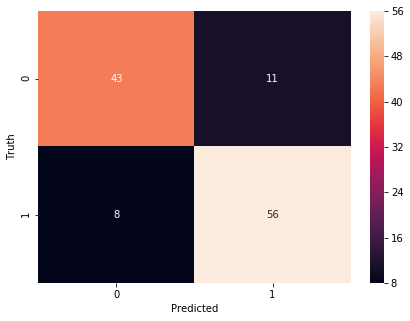

In [396]:
from sklearn.metrics import confusion_matrix
matrix = confusion_matrix(y_test, predicted[:,0].round())
draw_cm(matrix)

Вывод: рекуррентная сеть обучается в данном случае не совсем хорошо, т.к. недостаточно данных для такой конфигурации и структура данных 
    не совсем подходит для данного вида нейросетей. Это сделано для обзора возможности использовать разные виды нейросетей
    для одной и той же задачи и посмотреть их преимущества и недостатки.

### 2.4 Сверточная нейросеть

In [154]:
def get_array_from_matplotlib(series):
    
    from matplotlib.backends.backend_agg import FigureCanvasAgg
    from matplotlib.figure import Figure
    import numpy as np

    # make a Figure and attach it to a canvas.
    fig = Figure(figsize=(5, 4), dpi=100)
    canvas = FigureCanvasAgg(fig)

    # Do some plotting here
    ax = fig.add_subplot(111)
    ax.plot(series)
    
    plt.axis('off')

    # Retrieve a view on the renderer buffer
    canvas.draw()
    buf = canvas.buffer_rgba()
    # convert to a NumPy array
    X = np.asarray(buf)
    
    return X

#### Получаем датасет

In [155]:
y = np.array(concatenated_set[1])
X = np.array(concatenated_set.drop([0,1], axis='columns', inplace=False))

from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)

#### Переведем датасет в набор картинок

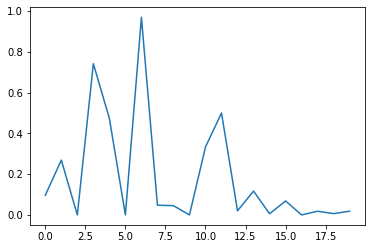

In [156]:
#Пример одной записи в виде картинки в matplotlib
plt.plot(X_scaled[2])

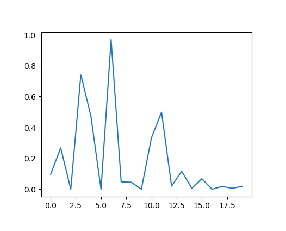

In [157]:
#Переводим запись в картинку
x = get_array_from_matplotlib(X_scaled[2])
plt.imshow(x)

In [178]:
def get_img_arr(X_scaled):
    
    img_list = []
    for x in X_scaled:
        img_list.append(get_array_from_matplotlib(x))
        
    img_array= np.array(img_list)
    
    
    return img_array

In [186]:
def resize_img_array_to_small(img_array, hight, width):
    import cv2
    resized_img_list = []

    for img in img_array:
        res = cv2.resize(img, dsize=(hight, width), interpolation=cv2.INTER_CUBIC)
        resized_img_list.append(res)

        resized_img_array= np.array(resized_img_list)

    return resized_img_array

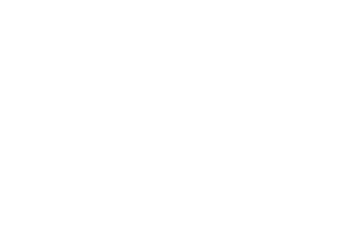

In [176]:
#Get img array
img_array = get_img_arr(X_scaled)

In [196]:
#resize img array to array of small images
img_array = resize_img_array_to_small(img_array, 100,80)

In [197]:
img_array.shape

(392, 80, 100, 4)

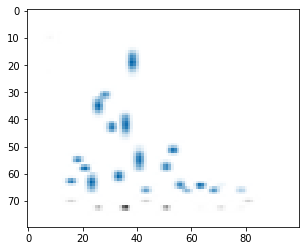

In [198]:
plt.imshow(img_array[3])

In [199]:
#Разбиваем датасет на тренировочный и тестовый
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(img_array,y,test_size=0.3, random_state=10)

In [200]:
# Normalize pixel values to be between 0 and 1
X_train, X_test = X_train / 255.0, X_test / 255.0

In [201]:
X_train.shape

(274, 80, 100, 4)

### Building the convolutional neural network

In [213]:
#Parameters
img_h = 80
img_w = 100
batch_size = 10
epochs = 100

In [214]:
# Initialising the CNN
cnn = tf.keras.models.Sequential()

# Step 1 - Convolution
cnn.add(tf.keras.layers.Conv2D(filters=32, kernel_size=3, activation='relu', input_shape=[img_h, img_w, 4]))

# Step 2 - Pooling
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2, strides=2))

# Adding a second convolutional layer
cnn.add(tf.keras.layers.Conv2D(filters=64, kernel_size=3, activation='relu'))
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2, strides=2))

# Step 3 - Flattening
cnn.add(tf.keras.layers.Flatten())

# Step 4 - Full Connection
cnn.add(tf.keras.layers.Dense(units=128, activation='relu'))

# Step 5 - Output Layer
#cnn.add(tf.keras.layers.Dense(units=9, activation='softmax'))
cnn.add(tf.keras.layers.Dense(units=1, activation='sigmoid'))

# Training the CNN

# Compiling the CNN
cnn.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

In [215]:
history = cnn.fit(X_train, y_train, epochs=epochs, 
                    validation_data=(X_test, y_test))

Epoch 1/100
9/9 [==============================] - 3s 353ms/step - loss: 1.6259 - accuracy: 0.5255 - val_loss: 0.6902 - val_accuracy: 0.5424
Epoch 2/100
9/9 [==============================] - 3s 283ms/step - loss: 0.6952 - accuracy: 0.4599 - val_loss: 0.6929 - val_accuracy: 0.4576
Epoch 3/100
9/9 [==============================] - 3s 280ms/step - loss: 0.6923 - accuracy: 0.4891 - val_loss: 0.6985 - val_accuracy: 0.4576
Epoch 4/100
9/9 [==============================] - 3s 305ms/step - loss: 0.6917 - accuracy: 0.5255 - val_loss: 0.6863 - val_accuracy: 0.5424
Epoch 5/100
9/9 [==============================] - 3s 288ms/step - loss: 0.6965 - accuracy: 0.5401 - val_loss: 0.6936 - val_accuracy: 0.4576
Epoch 6/100
9/9 [==============================] - 3s 317ms/step - loss: 0.6885 - accuracy: 0.5182 - val_loss: 0.6894 - val_accuracy: 0.4576
Epoch 7/100
9/9 [==============================] - 4s 429ms/step - loss: 0.6848 - accuracy: 0.5292 - val_loss: 0.6800 - val_accuracy: 0.7373
Epoch 8/100
9

Epoch 59/100
9/9 [==============================] - 3s 318ms/step - loss: 0.1563 - accuracy: 0.9416 - val_loss: 0.3753 - val_accuracy: 0.9237
Epoch 60/100
9/9 [==============================] - 3s 282ms/step - loss: 0.1336 - accuracy: 0.9526 - val_loss: 0.4124 - val_accuracy: 0.8898
Epoch 61/100
9/9 [==============================] - 3s 286ms/step - loss: 0.1178 - accuracy: 0.9562 - val_loss: 0.4728 - val_accuracy: 0.8898
Epoch 62/100
9/9 [==============================] - 2s 271ms/step - loss: 0.1568 - accuracy: 0.9489 - val_loss: 0.3840 - val_accuracy: 0.9153
Epoch 63/100
9/9 [==============================] - 3s 288ms/step - loss: 0.1198 - accuracy: 0.9526 - val_loss: 0.4033 - val_accuracy: 0.9237
Epoch 64/100
9/9 [==============================] - 3s 293ms/step - loss: 0.1184 - accuracy: 0.9599 - val_loss: 0.3820 - val_accuracy: 0.9153
Epoch 65/100
9/9 [==============================] - 3s 308ms/step - loss: 0.1205 - accuracy: 0.9635 - val_loss: 0.3836 - val_accuracy: 0.9153
Epoch 

#### Расчет метрик

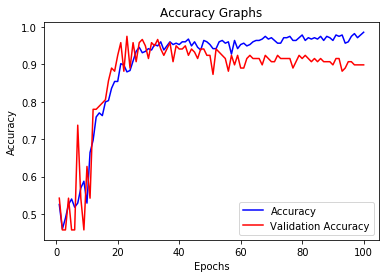

In [216]:
get_accuracy_graph(epochs, history)

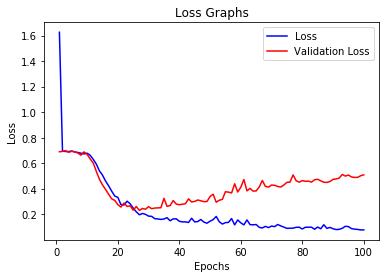

In [217]:
get_loss_graph(epochs, history)

#### Отчет по метрикам (Classification report)

In [219]:
from sklearn.metrics import classification_report
predicted = cnn.predict(X_test)
report = classification_report(y_test, predicted.round())
print(report)

              precision    recall  f1-score   support

           0       0.86      0.93      0.89        54
           1       0.93      0.88      0.90        64

    accuracy                           0.90       118
   macro avg       0.90      0.90      0.90       118
weighted avg       0.90      0.90      0.90       118



#### Confusion_matrix

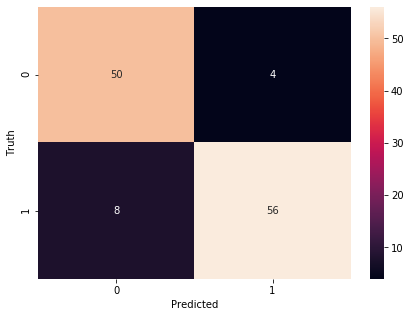

In [221]:
from sklearn.metrics import confusion_matrix
matrix = confusion_matrix(y_test, predicted.round())
draw_cm(matrix)

Вывод: эксперимент с данным видом нейросети получился. Даже если информацию по фичам закодировать в виде картинки и 
подать на обучение сверточной нейросети,то и она может показать хороший результат. 
Преимущеста сверточных сетей в том, что они могут классифицировать картинки, 
на которых может быть отображено любое количество фич, и более того, разные фичи на картинках уже отмасштабированны.    

### 2.5 Unsupervised learning - SOM (Самоорганизующиеся карты) + Supervised learning

#### Подготавливаем данные

In [420]:
y = np.array(concatenated_set[1])
X = np.array(concatenated_set.drop([1], axis='columns', inplace=False))
X = X[:,:12]
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0,1))
scaler.fit(X)
X_scaled = scaler.transform(X)

#### Создаем модель SOM и обучаем ее

In [492]:
#Training the SOM
from minisom import MiniSom

som = MiniSom(x= 3, y=3, input_len= len(X_scaled[0]), sigma=1.0, learning_rate = 0.5)
som.random_weights_init(X_scaled)
som.train_random(data = X_scaled, num_iteration=100)

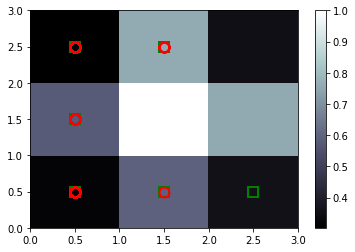

In [493]:
#Visualizing the results
from pylab import bone, pcolor, colorbar, plot, show
bone()
pcolor(som.distance_map().T)
colorbar()
markers = ['o','s']
colors =['r','g']

for i,x in enumerate(X):
    w = som.winner(x)
    plot(w[0] + 0.5,
        w[1] + 0.5,
        markers[y[i]],
        markeredgecolor = colors[y[i]],
         markerfacecolor = 'None',
         markersize = 10,
         markeredgewidth =2         
        )
show()

#### Кластеризуем пользователей в группы

In [499]:
#Кластеризуем пользователей в группы.
mappings = som.win_map(X)

groups_list=[]
for m in mappings:
    groups_list.append([m, len(mappings[m])])

groups = pd.DataFrame(groups_list, columns =['cluster', 'number_of_users'])
groups

,cluster,number_of_users
0,"(1, 0)",10
1,"(1, 2)",42
2,"(0, 1)",111
3,"(0, 2)",73
4,"(0, 0)",147
5,"(2, 0)",9


In [535]:
motivated_users_cluster = np.array(mappings[(2,0)])

In [549]:
# В кластере мотивированных пользователей находится 9 человек
len(motivated_users_cluster)

9

Данный график показывает, что модель состоит из 9 кластеров, так как ее размерность 3*3. 
Однако, модель распределила всех пользователей по 6 кластерам.
Красный круг говорит о том, что в данном кластере присутсвуют пользователи только с демо счетом.
Зеленый квадрат свидетельствует о наличии пользователей с реальным счетом.
В пять кластеров пользователи попадают как с реальными так и с демо счетами.
Однако, в группу (2, 0) попадают только те пользователи, у которых есть реальный счет.
Таким образом данная группа нам будет интересна особо, т.к. судя по всему, это группа особо мотивированных пользователей
завести реальный счет.

#### Supervised learning

Получив кластера, мы можем обучить модель нейросети, которая так же будет по профилю пользователя идентифицировать,
принадлежит ли он к группе мотивированных пользователей под номером (2,0) или нет.

In [550]:
#Составляем матрицы фич

In [574]:
customers = np.array(concatenated_set.drop([0,1], axis='columns', inplace=False))
customers= customers[:,:10]

In [575]:
is_motivated_users_group = np.zeros(len(customers)) 

Размечаем выборку пользователей, относящихся к группе мотивированных пользователей для 
модели обучения с учителем, то есть - нейросети.
Если айдишники юзеров встречаются в группе мотивимрованных пользователей, 
то проставляем 1 в массиве разметки: is_motivated_users_group

In [576]:
for i in range(len(X)):
    if X[i,0] in motivated_users_cluster[:, 0]:
        print(X[i,0])
        is_motivated_users_group[i] = 1
        
is_motivated_users_group = np.array(is_motivated_users_group)

142849129
43956031
96445456
130101829
156376024
54631687
8240341
1919371
73363570


In [577]:
#Проверка, что в массиве разметки проставлены единицами значения всех мотивированных пользователейсоответвенно.
len(is_motivated_users_group[is_motivated_users_group[:]==1])

9

#### Building ANN

Создаем нейросеть, предсказывающую по профилю пользователей, что они относятся к 
группе мотивированных пользователей, определенной в процессе кластеризации.

In [563]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
customers_scaled = sc.fit_transform(customers)

In [564]:
import tensorflow as tf
tf.__version__

'2.3.0'

In [581]:
ann = tf.keras.models.Sequential()
ann.add(tf.keras.layers.Dense(units=2, kernel_initializer = 'uniform',input_dim = 10))
ann.add(tf.keras.layers.Dense(units=1, kernel_initializer = 'uniform', activation='sigmoid'))
ann.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

In [582]:
ann.fit(customers_scaled, is_motivated_users_group, batch_size = 1, epochs = 50)

Epoch 1/50
392/392 [==============================] - 0s 809us/step - loss: 0.5831 - accuracy: 0.9643
Epoch 2/50
392/392 [==============================] - 0s 829us/step - loss: 0.3317 - accuracy: 0.9745
Epoch 3/50
392/392 [==============================] - 0s 1ms/step - loss: 0.1831 - accuracy: 0.9745
Epoch 4/50
392/392 [==============================] - 0s 1ms/step - loss: 0.1282 - accuracy: 0.9770
Epoch 5/50
392/392 [==============================] - 0s 1ms/step - loss: 0.1047 - accuracy: 0.9770
Epoch 6/50
392/392 [==============================] - 0s 770us/step - loss: 0.0915 - accuracy: 0.9796
Epoch 7/50
392/392 [==============================] - 0s 758us/step - loss: 0.0829 - accuracy: 0.9821
Epoch 8/50
392/392 [==============================] - 0s 796us/step - loss: 0.0780 - accuracy: 0.9821
Epoch 9/50
392/392 [==============================] - 0s 847us/step - loss: 0.0745 - accuracy: 0.9821
Epoch 10/50
392/392 [==============================] - 0s 1ms/step - loss: 0.0717 - accu

#### Предсказываем пользователей, которые с большой вероятностью могут входить в группу

In [616]:
y_pred = ann.predict(customers_scaled)
users = X[:, 0:1]
motivated_users_probabilities = pd.DataFrame(users, columns =['users'])
motivated_users_probabilities['prob'] = y_pred
motivated_users_probabilities.sort_values('prob')

,users,prob
7,82280143,1.033359e-37
4,108248584,2.239890e-23
178,120773938,1.863643e-20
159,156984811,4.394544e-19
339,120605479,3.623170e-16
210,34864648,5.784620e-16
48,148981705,5.030544e-15
75,152206933,8.991378e-15
156,4898818,4.918403e-14
388,42946171,1.487271e-13


Вывод: Итогом данной программы является ранжирование пользователей по вероятности принадлежности их 
к группе мотивированных пользователей. Данная группа была выявленна самоорганизующейся картой на основе кластеризации
пользователей по их профилю. Профилем пользователей может являться набор фич, выявленных в результате фиче-инжиниринга.
После выявления интересной группы путем кластеризации, обучена нейросеть, 
которая так же на основе профиля пользователя может предсказывать их принадлежность к тому или иному кластеру.
Таким образом данный метод является комбинаций двух подходов в машинном обучении: 
    1. unsupervised learning - стадия выявления кластеров пользователей
    2. supervised learning - обучение нейросети классфификации пользователей по принадлежности к данным кластерам.
    
Так как, данных было выбрано очень мало, то вероятности также имеют малое значение. И данные модели требуют большее количество
данных. Цель - была просто изучить разные подходы машинного обучения в решении данной задачи.